# block

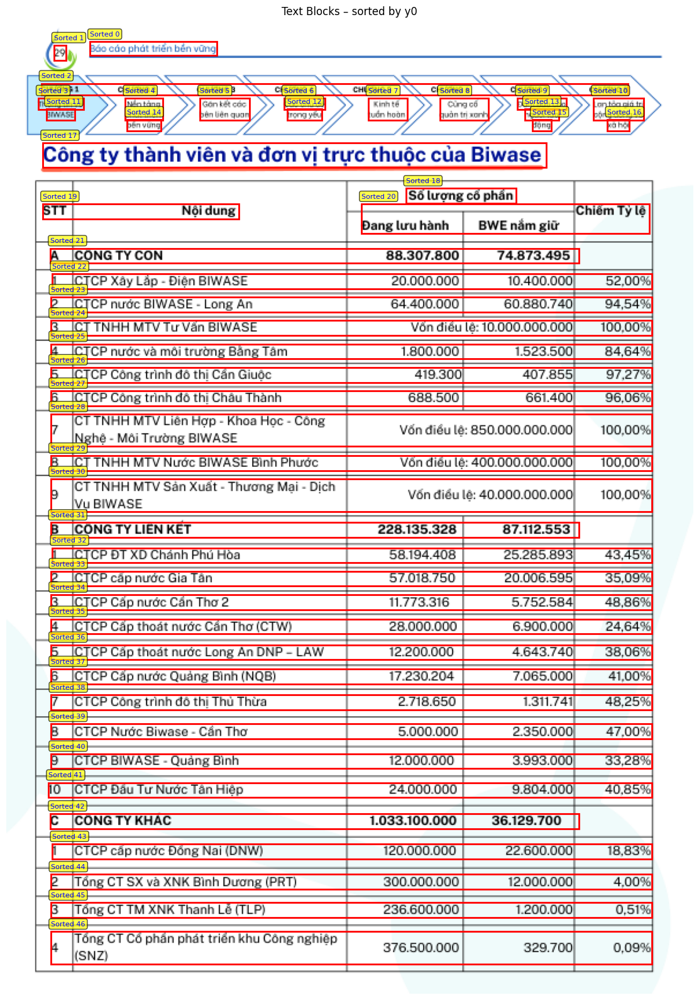

In [14]:
from PIL import Image
import io
import pymupdf
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# 0. Mở file & lấy page
doc  = pymupdf.open('../data/pdfs/pages/page_29.pdf')
page = doc[0]

# 1. Lấy blocks & render ảnh
blocks = page.get_text("blocks")
zoom = 1
pix    = page.get_pixmap(matrix=pymupdf.Matrix(zoom, zoom))  # zoom 200%
img    = Image.open(io.BytesIO(pix.tobytes("png")))

# 2. Sắp xếp theo y0 (từ trên xuống)
sorted_blocks = sorted(blocks, key=lambda b: b[1])

sequences_page = []

# 4. In ra console thứ tự mới
for idx, b in enumerate(sorted_blocks):
    x0, y0, x1, y1, text, bno, btype = b
    if btype == 0:
        # print(f'Sorted {idx}: y0={y0:6.2f} | {text[:50].strip()}...')
        sequences_page.append(text.strip())
        
# 5. VẼ ẢNH 2: khung theo thứ tự y0
fig, ax = plt.subplots(1, figsize=(12, 16))
ax.imshow(img)
for idx, b in enumerate(sorted_blocks):
    x0, y0, x1, y1, text, bno, btype = b
    if btype == 0:
        ax.add_patch(patches.Rectangle((x0, y0), x1-x0, y1-y0,
                                        linewidth=2, edgecolor='red', facecolor='none'))
        ax.text(x0, y0-5, f'Sorted {idx}', color='blue', fontsize=8,
                bbox=dict(boxstyle='round', facecolor='yellow', alpha=.7))
ax.axis('off'); ax.set_title('Text Blocks – sorted by y0'); plt.tight_layout(); plt.show()

# dict

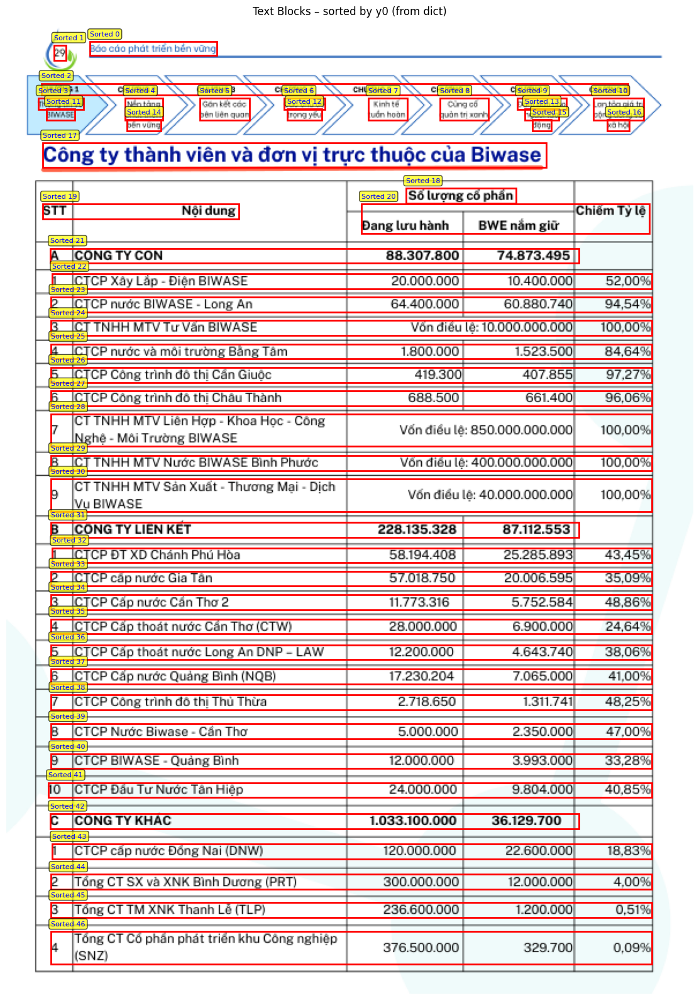

In [17]:
from PIL import Image
import io
import pymupdf
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# 0. Mở file & lấy page
doc  = pymupdf.open('../data/pdfs/pages/page_29.pdf')
page = doc[0]

# 1. Lấy DICT thay vì BLOCKS + render ảnh
zoom = 1
pix  = page.get_pixmap(matrix=pymupdf.Matrix(zoom, zoom))
img  = Image.open(io.BytesIO(pix.tobytes("png")))

page_dict = page.get_text("dict")          # <--- đổi sang dict
blocks    = []                             # chuyển dict → list block tương tự
for block in page_dict["blocks"]:
    if block["type"] == 0:                 # chỉ text block
        x0, y0, x1, y1 = block["bbox"]
        text = "".join(
            span["text"]
            for line in block["lines"]
            for span in line["spans"]
        )
        blocks.append((x0, y0, x1, y1, text, block["number"], 0))

# 2. Sắp xếp theo y0
sorted_blocks = sorted(blocks, key=lambda b: b[1])

# 3. Vẽ
fig, ax = plt.subplots(1, figsize=(12, 16))
ax.imshow(img)
for idx, b in enumerate(sorted_blocks):
    x0, y0, x1, y1, text, bno, btype = b
    ax.add_patch(patches.Rectangle((x0, y0), x1-x0, y1-y0,
                                   linewidth=2, edgecolor='red', facecolor='none'))
    ax.text(x0, y0-5, f'Sorted {idx}', color='blue', fontsize=8,
            bbox=dict(boxstyle='round', facecolor='yellow', alpha=.7))
ax.axis('off'); ax.set_title('Text Blocks – sorted by y0 (from dict)'); plt.tight_layout(); plt.show()

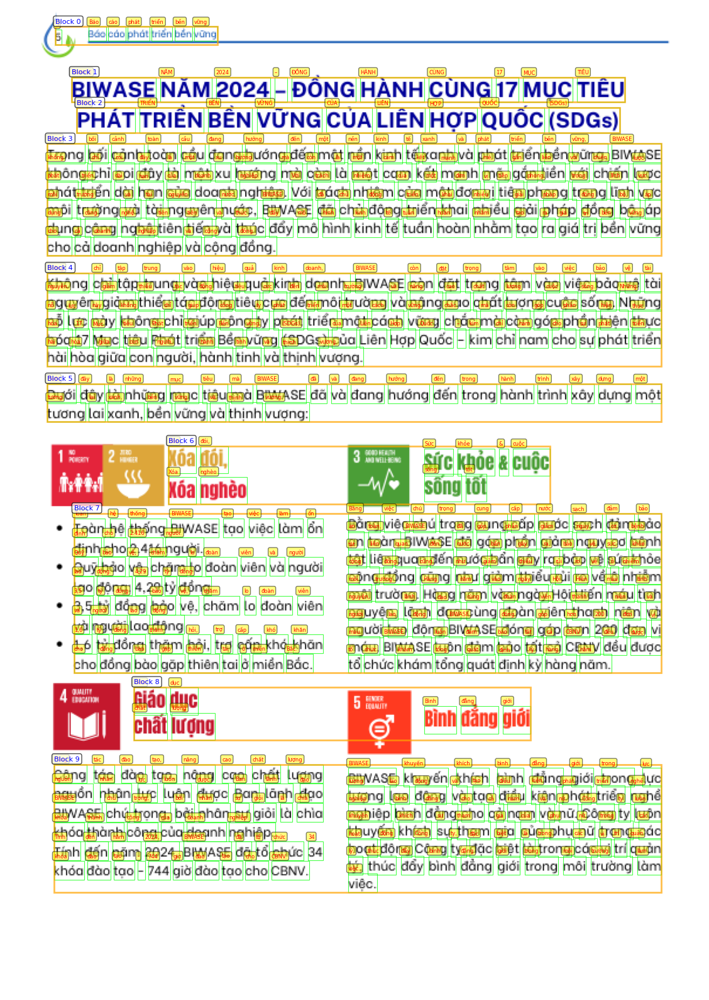

In [124]:
from PIL import Image
import io
import pymupdf
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# 0️⃣ Mở file & lấy page
doc  = pymupdf.open('../data/pdfs/pages/page_5.pdf')
page = doc[0]

# 1️⃣ Lấy danh sách từ & render ảnh nền
words = page.get_text("words")   # từng từ + tọa độ
pix   = page.get_pixmap(matrix=pymupdf.Matrix(1, 1))
img   = Image.open(io.BytesIO(pix.tobytes("png")))

# 2️⃣ Lấy cấu trúc block (từ "dict")
page_dict = page.get_text("dict")
blocks = []
for block in page_dict["blocks"]:
    if block["type"] == 0:  # chỉ text block
        x0, y0, x1, y1 = block["bbox"]
        text = "".join(
            span["text"]
            for line in block["lines"]
            for span in line["spans"]
        )
        blocks.append((x0, y0, x1, y1, text, block["number"], 0))

# 3️⃣ Sắp xếp
sorted_words = sorted(words, key=lambda w: (w[1], w[0]))
sorted_blocks = sorted(blocks, key=lambda b: (b[1], b[0]))

# 🔹 Gộp block nếu y0 cách nhau < 1.5 pixel
merged_blocks = []
for block in sorted_blocks:
    x0, y0, x1, y1, text, bno, _ = block
    if merged_blocks:
        prev_x0, prev_y0, prev_x1, prev_y1, prev_text, prev_bno, _ = merged_blocks[-1]
        if y0 - prev_y1 < 5:  # khoảng cách theo y nhỏ hơn 5 pixel
            # Gộp block cũ và block mới
            new_x0 = min(prev_x0, x0)
            new_y0 = min(prev_y0, y0)
            new_x1 = max(prev_x1, x1)
            new_y1 = max(prev_y1, y1)
            new_text = prev_text + " " + text
            merged_blocks[-1] = (new_x0, new_y0, new_x1, new_y1, new_text, prev_bno, 0)
            continue
    merged_blocks.append(block)

# 4️⃣ Vẽ hình
fig, ax = plt.subplots(1, figsize=(12, 16))
ax.imshow(img)

# 🟩 Bounding box cho từng từ
for idx, w in enumerate(sorted_words):
    x0, y0, x1, y1, text, block_no, line_no, word_no = w
    ax.add_patch(patches.Rectangle((float(x0), float(y0)), float(x1)-float(x0), float(y1)-float(y0),
                                   linewidth=0.8, edgecolor='lime', facecolor='none', alpha=0.7))
    ax.text(float(x0), float(y0)-3, text, color='red', fontsize=6,
            bbox=dict(boxstyle='round', facecolor='yellow', alpha=.5))

# 🟥 Bounding box cho từng block đã gộp
for idx, b in enumerate(merged_blocks):
    x0, y0, x1, y1, text, bno, _ = b
    ax.add_patch(patches.Rectangle((x0, y0), x1-x0, y1-y0,
                                   linewidth=2, edgecolor='orange', facecolor='none', alpha=0.7))
    ax.text(x0, y0-3, f'Block {idx}', color='blue', fontsize=8,
            bbox=dict(boxstyle='round', facecolor='white', alpha=.7))

ax.axis('off')
plt.tight_layout()
plt.show()


✅ Processed page 5: 15 final blocks


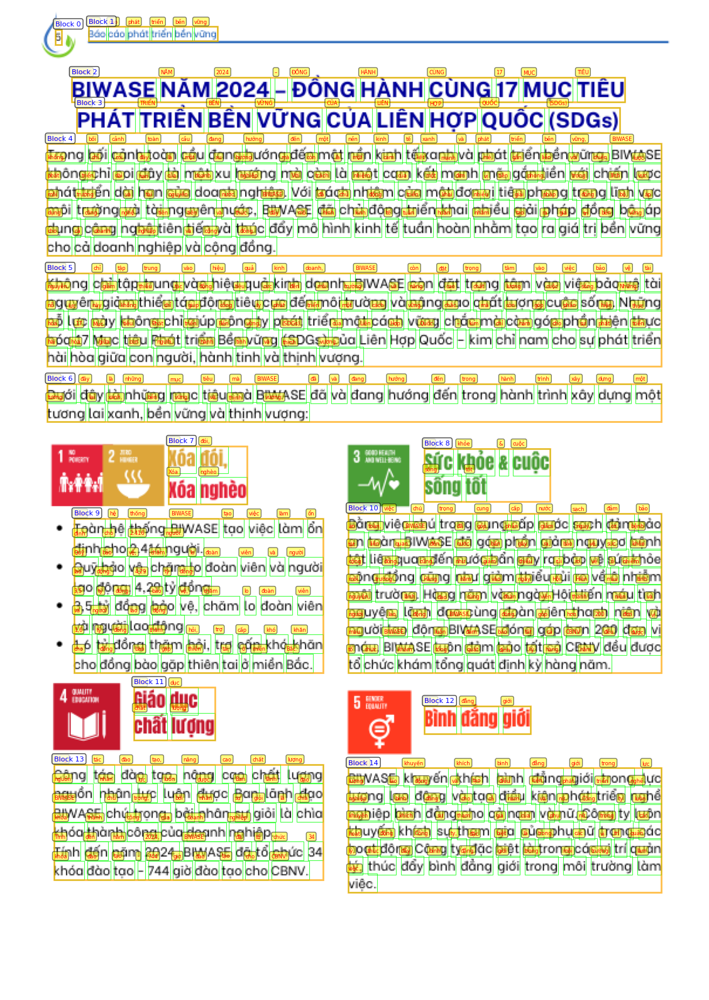

✅ Processed page 6: 9 final blocks


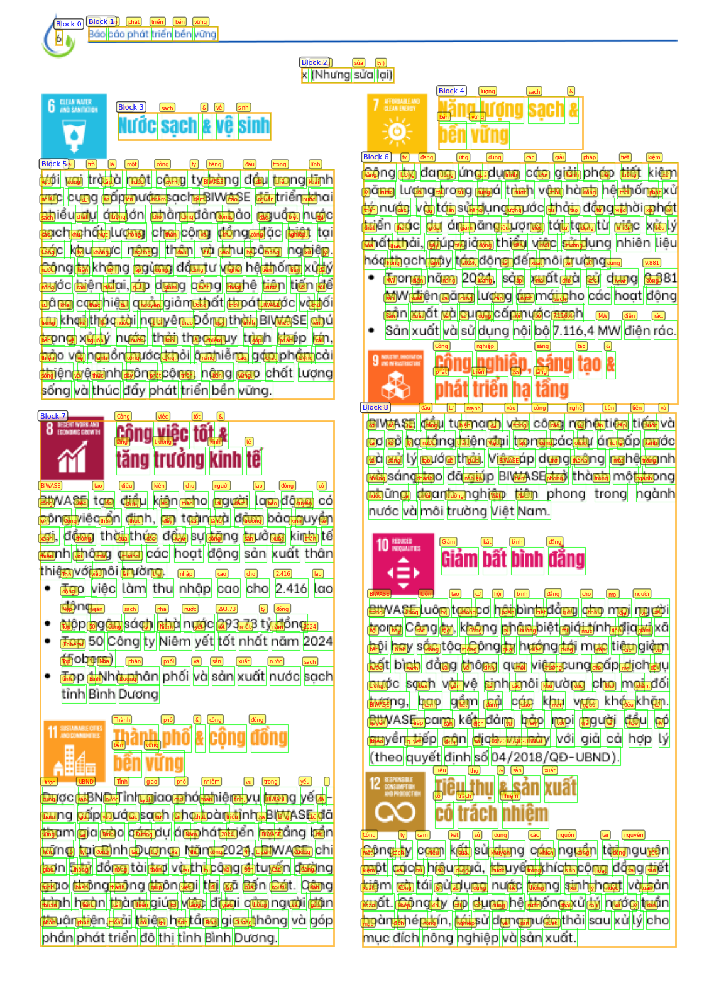

In [128]:
from PIL import Image
import io
import pymupdf
import matplotlib.pyplot as plt
import matplotlib.patches as patches

class PDFPageProcessor:
    def __init__(self, pdf_path, page_num=0):
        self.pdf_path = pdf_path
        self.page_num = page_num
        self.doc = None
        self.page = None
        self.words = None
        self.pix = None
        self.img = None
        self.blocks = None
        self.sorted_words = None
        self.sorted_blocks = None
        self.merged_blocks = None
        self.final_blocks = None

    def load_page(self):
        self.doc = pymupdf.open(self.pdf_path)
        self.page = self.doc[self.page_num]

    def get_words_and_image(self):
        self.words = self.page.get_text("words")
        self.pix = self.page.get_pixmap(matrix=pymupdf.Matrix(1, 1))
        self.img = Image.open(io.BytesIO(self.pix.tobytes("png")))

    def extract_blocks(self):
        page_dict = self.page.get_text("dict")
        self.blocks = []
        for block in page_dict["blocks"]:
            if block["type"] == 0:  # chỉ text block
                x0, y0, x1, y1 = block["bbox"]
                spans = [span for line in block["lines"] for span in line["spans"]]
                self.blocks.append((x0, y0, x1, y1, spans, block["number"], 0))

    def sort_elements(self):
        self.sorted_words = sorted(self.words, key=lambda w: (w[1], w[0]))
        self.sorted_blocks = sorted(self.blocks, key=lambda b: (b[1], b[0]))

    def merge_blocks(self):
        self.merged_blocks = []
        for block in self.sorted_blocks:
            x0, y0, x1, y1, spans, bno, _ = block
            if self.merged_blocks:
                prev_x0, prev_y0, prev_x1, prev_y1, prev_spans, prev_bno, _ = self.merged_blocks[-1]
                if y0 - prev_y1 < 0.2:  # khoảng cách theo y nhỏ hơn 5 pixel
                    # Gộp block cũ và block mới
                    new_x0 = min(prev_x0, x0)
                    new_y0 = min(prev_y0, y0)
                    new_x1 = max(prev_x1, x1)
                    new_y1 = max(prev_y1, y1)
                    new_spans = prev_spans + spans
                    self.merged_blocks[-1] = (new_x0, new_y0, new_x1, new_y1, new_spans, prev_bno, 0)
                    continue
            self.merged_blocks.append(block)

    def split_blocks(self):
        self.final_blocks = []
        for merged_block in self.merged_blocks:
            x0, y0, x1, y1, spans, bno, _ = merged_block
            if not spans:
                self.final_blocks.append(merged_block)
                continue
            # Sắp xếp spans theo x0
            sorted_spans = sorted(spans, key=lambda s: s["bbox"][0])
            # Nhóm thành sub_blocks
            sub_blocks = []
            current_group = [sorted_spans[0]]
            current_x1 = sorted_spans[0]["bbox"][2]
            for span in sorted_spans[1:]:
                if span["bbox"][0] - current_x1 > 0.1:
                    # Tách
                    sub_blocks.append(current_group)
                    current_group = [span]
                    current_x1 = span["bbox"][2]
                else:
                    current_group.append(span)
                    current_x1 = max(current_x1, span["bbox"][2])
            if current_group:
                sub_blocks.append(current_group)
            # Tạo final blocks từ sub_blocks
            for group in sub_blocks:
                if not group:
                    continue
                group_x0 = min(s["bbox"][0] for s in group)
                group_y0 = min(s["bbox"][1] for s in group)
                group_x1 = max(s["bbox"][2] for s in group)
                group_y1 = max(s["bbox"][3] for s in group)
                self.final_blocks.append((group_x0, group_y0, group_x1, group_y1, group, bno, 0))

    def plot(self):
        fig, ax = plt.subplots(1, figsize=(12, 16))
        ax.imshow(self.img)

        # 🟩 Bounding box cho từng từ
        for idx, w in enumerate(self.sorted_words):
            x0, y0, x1, y1, text, block_no, line_no, word_no = w
            ax.add_patch(patches.Rectangle((float(x0), float(y0)), float(x1)-float(x0), float(y1)-float(y0),
                                           linewidth=0.8, edgecolor='lime', facecolor='none', alpha=0.7))
            ax.text(float(x0), float(y0)-3, text, color='red', fontsize=6,
                    bbox=dict(boxstyle='round', facecolor='yellow', alpha=.5))

        # 🟥 Bounding box cho từng block đã gộp
        for idx, b in enumerate(self.final_blocks):
            x0, y0, x1, y1, spans, bno, _ = b
            ax.add_patch(patches.Rectangle((x0, y0), x1-x0, y1-y0,
                                           linewidth=2, edgecolor='orange', facecolor='none', alpha=0.7))
            ax.text(x0, y0-3, f'Block {idx}', color='blue', fontsize=8,
                    bbox=dict(boxstyle='round', facecolor='white', alpha=.7))

        ax.axis('off')
        plt.tight_layout()
        plt.show()

# Usage example
if __name__ == "__main__":
    for i in range(4,6):
        pdf_path = f"../data/pdfs/pages/page_{i+1}.pdf"
        processor = PDFPageProcessor(pdf_path, page_num=0)
        processor.load_page()
        processor.get_words_and_image()
        processor.extract_blocks()
        processor.sort_elements()
        processor.merge_blocks()
        processor.split_blocks()
        print(f"✅ Processed page {i+1}: {len(processor.final_blocks)} final blocks")
        processor.plot()


#agent

In [111]:
# Trích xuất text theo thứ tự đọc tự nhiên (trên → dưới, trái → phải)
# Cột cách nhau bởi '|', hàng cách nhau bởi '\n\n'

full_text = []

for row_idx, row_columns in enumerate(merge_rows_columns):
    row_parts = []
    
    for col_idx, column in enumerate(row_columns):
        # Gộp tất cả từ trong cột thành chuỗi
        col_text = " ".join([w[4] for w in column])
        row_parts.append(col_text)
    
    # Nối các cột bằng ' | '
    full_text.append(" | ".join(row_parts))

# Nối các hàng bằng '\n\n'
final_text = "\n\n".join(full_text)

print("="*100)
print("📖 TEXT TRÍCH XUẤT (Trên → Dưới, Trái → Phải)")
print("="*100)
print(final_text)
print("="*100)
print(f"\n✅ Tổng số hàng: {len(full_text)}")
print(f"✅ Tổng số ký tự: {len(final_text)}")

📖 TEXT TRÍCH XUẤT (Trên → Dưới, Trái → Phải)
29 | Báo cáo phát triển bền vững

CHƯƠNG 1 | CHƯƠNG 2 | CHƯƠNG 3 | CHƯƠNG 4 | CHƯƠNG 5 | CHƯƠNG 6 | CHƯƠNG 7 | CHƯƠNG 8

Thông BIWASE tin về | phát bền Nền vững tảng triển | bên Găn liên kết quan các | Các trọng chủ yếu đề | tuần Kinh hoàn tế | quản Củng trị cố xanh | Đảm người động bảo lao cho | Lan cộng xã tỏa đồng hội giá và trị

Công ty thành viên và đơn vị trực thuộc của Biwase

Số lượng cổ phần

STT | Nội dung | Chiếm Tỷ lệ

Đang lưu hành | BWE nắm giữ

A | CÔNG TY CON | 88.307.800 | 74.873.495

1 | CTCP Xây Lắp - Điện BIWASE | 20.000.000 | 10.400.000 | 52,00%

2 | CTCP nước BIWASE - Long An | 64.400.000 | 60.880.740 | 94,54%

3 | CT TNHH MTV Tư Vấn BIWASE | Vốn điều lệ: 10.000.000.000 | 100,00%

4 | CTCP nước và môi trường Bằng Tâm | 1.800.000 | 1.523.500 | 84,64%

5 | CTCP Công trình đô thị Cần Giuộc | 419.300 | 407.855 | 97,27%

6 | CTCP Công trình đô thị Châu Thành | 688.500 | 661.400 | 96,06%

7 | CT Nghệ TNHH - Môi MTV Trường Liê

In [112]:
for t in final_text.split("\n\n"):
    print(t)

29 | Báo cáo phát triển bền vững
CHƯƠNG 1 | CHƯƠNG 2 | CHƯƠNG 3 | CHƯƠNG 4 | CHƯƠNG 5 | CHƯƠNG 6 | CHƯƠNG 7 | CHƯƠNG 8
Thông BIWASE tin về | phát bền Nền vững tảng triển | bên Găn liên kết quan các | Các trọng chủ yếu đề | tuần Kinh hoàn tế | quản Củng trị cố xanh | Đảm người động bảo lao cho | Lan cộng xã tỏa đồng hội giá và trị
Công ty thành viên và đơn vị trực thuộc của Biwase
Số lượng cổ phần
STT | Nội dung | Chiếm Tỷ lệ
Đang lưu hành | BWE nắm giữ
A | CÔNG TY CON | 88.307.800 | 74.873.495
1 | CTCP Xây Lắp - Điện BIWASE | 20.000.000 | 10.400.000 | 52,00%
2 | CTCP nước BIWASE - Long An | 64.400.000 | 60.880.740 | 94,54%
3 | CT TNHH MTV Tư Vấn BIWASE | Vốn điều lệ: 10.000.000.000 | 100,00%
4 | CTCP nước và môi trường Bằng Tâm | 1.800.000 | 1.523.500 | 84,64%
5 | CTCP Công trình đô thị Cần Giuộc | 419.300 | 407.855 | 97,27%
6 | CTCP Công trình đô thị Châu Thành | 688.500 | 661.400 | 96,06%
7 | CT Nghệ TNHH - Môi MTV Trường Liên BIWASE Hợp - Khoa Học - Công | Vốn điều lệ: 850.000.000.0

In [ ]:
# Lưu kết quả vào file
output_path = "../data/extracted_text_page_29.txt"

with open(output_path, 'w', encoding='utf-8') as f:
    f.write(final_text)

print(f"✅ Đã lưu text vào file: {output_path}")

# Phân tích số cột bằng xử lý ảnh

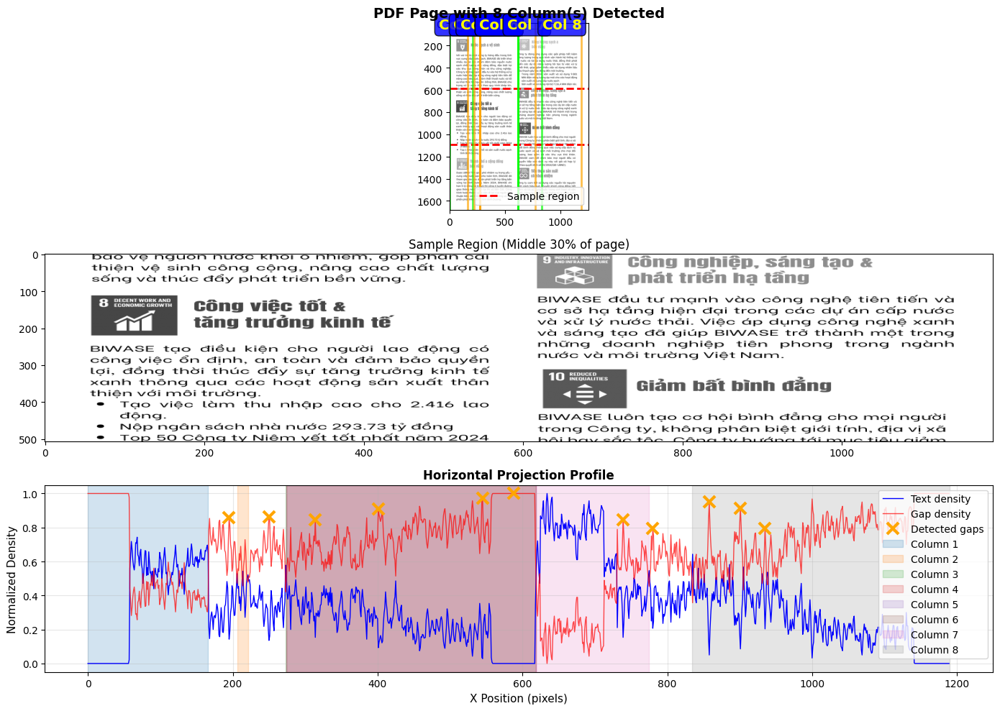


📊 KẾT QUẢ PHÂN TÍCH SỐ CỘT
✅ Số cột phát hiện: 8
📏 Kích thước ảnh: 1190 x 1685 pixels

📍 Ranh giới các cột:
   Cột 1: x=   0 →  166 (width= 166px)
   Cột 2: x= 206 →  221 (width=  15px)
   Cột 3: x= 273 →  274 (width=   1px)
   Cột 4: x= 619 →  274 (width=-345px)
   Cột 5: x= 619 →  274 (width=-345px)
   Cột 6: x= 619 →  274 (width=-345px)
   Cột 7: x= 619 →  775 (width= 156px)
   Cột 8: x= 834 → 1190 (width= 356px)

🔲 Khoảng trắng giữa các cột:
   Gap 1: x= 166 →  206 (width=  40px)
   Gap 2: x= 221 →  273 (width=  52px)
   Gap 3: x= 274 →  619 (width= 345px)
   Gap 4: x= 274 →  619 (width= 345px)
   Gap 5: x= 274 →  619 (width= 345px)
   Gap 6: x= 274 →  619 (width= 345px)
   Gap 7: x= 775 →  834 (width=  59px)


In [5]:
import numpy as np
import cv2
from PIL import Image
import io
import pymupdf
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

def detect_columns_by_image_processing(pdf_path: str, page_number: int = 0, 
                                       min_gap_width: int = 20, 
                                       vertical_sample_height: float = 0.3,
                                       threshold: int = 240,
                                       debug: bool = True):
    """
    Phát hiện số cột trong trang PDF bằng xử lý ảnh
    
    Args:
        pdf_path: Đường dẫn file PDF
        page_number: Số trang (0-indexed)
        min_gap_width: Khoảng trắng tối thiểu giữa 2 cột (pixel)
        vertical_sample_height: Tỷ lệ chiều cao để lấy mẫu (0-1)
        threshold: Ngưỡng để coi là vùng trắng (0-255)
        debug: Hiển thị biểu đồ phân tích
    
    Returns:
        dict: {
            'num_columns': int - Số cột phát hiện được,
            'column_boundaries': list - Tọa độ [x_start, x_end] của mỗi cột,
            'gaps': list - Vị trí các khoảng trắng giữa cột
        }
    """
    
    # === BƯỚC 1: Render PDF thành ảnh ===
    doc = pymupdf.open(pdf_path)
    page = doc[page_number]
    
    # Render với độ phân giải cao để phân tích chính xác
    zoom = 2  # Tăng độ phân giải
    mat = pymupdf.Matrix(zoom, zoom)
    pix = page.get_pixmap(matrix=mat)
    img_pil = Image.open(io.BytesIO(pix.tobytes("png")))
    
    # Chuyển sang grayscale
    img_gray = np.array(img_pil.convert('L'))
    
    doc.close()
    
    # === BƯỚC 2: Lấy vùng mẫu từ giữa trang ===
    height, width = img_gray.shape
    
    # Lấy 30% chiều cao ở giữa trang (bỏ header/footer)
    start_y = int(height * (0.5 - vertical_sample_height / 2))
    end_y = int(height * (0.5 + vertical_sample_height / 2))
    sample_region = img_gray[start_y:end_y, :]
    
    # === BƯỚC 3: Tính Horizontal Projection Profile ===
    # Đếm số pixel trắng theo từng cột (chiều dọc)
    # Giá trị cao = nhiều text, giá trị thấp = khoảng trắng
    projection = np.sum(sample_region < threshold, axis=0)  # Đếm pixel đen (text)
    
    # Chuẩn hóa về [0, 1]
    if projection.max() > 0:
        projection_norm = projection / projection.max()
    else:
        projection_norm = projection
    
    # === BƯỚC 4: Tìm các vùng trống (gaps) giữa các cột ===
    # Đảo ngược: vùng trống = giá trị cao
    inverted_projection = 1 - projection_norm
    
    # Tìm peaks (vùng trống)
    peaks, properties = find_peaks(inverted_projection, 
                                   height=0.7,  # Vùng trống phải rõ ràng
                                   distance=min_gap_width,  # Khoảng cách tối thiểu
                                   prominence=0.3)  # Độ nổi bật
    
    # === BƯỚC 5: Xác định ranh giới cột ===
    column_boundaries = []
    gaps = []
    
    if len(peaks) == 0:
        # Không có gap => 1 cột
        column_boundaries = [[0, width]]
        num_columns = 1
    else:
        # Tính độ rộng của mỗi gap
        gap_widths = []
        for peak in peaks:
            # Tìm biên trái và phải của gap
            left = peak
            right = peak
            
            # Mở rộng sang trái
            while left > 0 and inverted_projection[left] > 0.5:
                left -= 1
            
            # Mở rộng sang phải
            while right < len(inverted_projection) - 1 and inverted_projection[right] > 0.5:
                right += 1
            
            gap_widths.append(right - left)
            gaps.append([left, right])
        
        # Lọc gaps thật sự (đủ rộng)
        valid_gaps = [g for g, w in zip(gaps, gap_widths) if w >= min_gap_width]
        
        # Xác định ranh giới cột
        if len(valid_gaps) == 0:
            column_boundaries = [[0, width]]
            num_columns = 1
        else:
            # Cột đầu tiên: từ 0 đến gap đầu
            column_boundaries.append([0, valid_gaps[0][0]])
            
            # Các cột giữa
            for i in range(len(valid_gaps) - 1):
                column_boundaries.append([valid_gaps[i][1], valid_gaps[i+1][0]])
            
            # Cột cuối: từ gap cuối đến width
            column_boundaries.append([valid_gaps[-1][1], width])
            
            num_columns = len(column_boundaries)
            gaps = valid_gaps
    
    # === BƯỚC 6: Visualization (nếu debug=True) ===
    if debug:
        fig, axes = plt.subplots(3, 1, figsize=(14, 10))
        
        # 6.1: Ảnh gốc với vùng mẫu
        axes[0].imshow(img_gray, cmap='gray')
        axes[0].axhline(y=start_y, color='red', linestyle='--', linewidth=2, label='Sample region')
        axes[0].axhline(y=end_y, color='red', linestyle='--', linewidth=2)
        
        # Vẽ ranh giới cột
        for i, (x_start, x_end) in enumerate(column_boundaries):
            axes[0].axvline(x=x_start, color='lime', linewidth=2, alpha=0.7)
            axes[0].axvline(x=x_end, color='orange', linewidth=2, alpha=0.7)
            # Label cột
            col_center = (x_start + x_end) / 2
            axes[0].text(col_center, 50, f'Col {i+1}', 
                        color='yellow', fontsize=14, weight='bold',
                        bbox=dict(boxstyle='round', facecolor='blue', alpha=0.8),
                        ha='center')
        
        axes[0].set_title(f'PDF Page with {num_columns} Column(s) Detected', fontsize=14, weight='bold')
        axes[0].legend()
        
        # 6.2: Vùng mẫu
        axes[1].imshow(sample_region, cmap='gray', aspect='auto')
        axes[1].set_title('Sample Region (Middle 30% of page)', fontsize=12)
        
        # 6.3: Projection profile
        x_axis = np.arange(len(projection_norm))
        axes[2].plot(x_axis, projection_norm, color='blue', linewidth=1, label='Text density')
        axes[2].plot(x_axis, inverted_projection, color='red', linewidth=1, alpha=0.7, label='Gap density')
        
        # Đánh dấu peaks (gaps)
        if len(peaks) > 0:
            axes[2].plot(peaks, inverted_projection[peaks], "x", color='orange', markersize=12, 
                        markeredgewidth=3, label='Detected gaps')
        
        # Tô vùng cột
        for i, (x_start, x_end) in enumerate(column_boundaries):
            axes[2].axvspan(x_start, x_end, alpha=0.2, color=f'C{i}', label=f'Column {i+1}')
        
        axes[2].set_xlabel('X Position (pixels)', fontsize=11)
        axes[2].set_ylabel('Normalized Density', fontsize=11)
        axes[2].set_title('Horizontal Projection Profile', fontsize=12, weight='bold')
        axes[2].legend(loc='upper right')
        axes[2].grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
    
    return {
        'num_columns': num_columns,
        'column_boundaries': column_boundaries,
        'gaps': gaps,
        'projection': projection_norm,
        'image_width': width,
        'image_height': height
    }


# === TEST ===
pdf_path = "../data/pdfs/pages/page_6.pdf"
result = detect_columns_by_image_processing(pdf_path, page_number=0, 
                                            min_gap_width=30, 
                                            debug=True)

print("\n" + "="*80)
print("📊 KẾT QUẢ PHÂN TÍCH SỐ CỘT")
print("="*80)
print(f"✅ Số cột phát hiện: {result['num_columns']}")
print(f"📏 Kích thước ảnh: {result['image_width']} x {result['image_height']} pixels")
print(f"\n📍 Ranh giới các cột:")
for i, (x_start, x_end) in enumerate(result['column_boundaries']):
    width = x_end - x_start
    print(f"   Cột {i+1}: x={x_start:4d} → {x_end:4d} (width={width:4d}px)")

if result['gaps']:
    print(f"\n🔲 Khoảng trắng giữa các cột:")
    for i, (left, right) in enumerate(result['gaps']):
        gap_width = right - left
        print(f"   Gap {i+1}: x={left:4d} → {right:4d} (width={gap_width:4d}px)")
else:
    print("\n🔲 Không phát hiện khoảng trắng (Single column)")
print("="*80)

In [4]:
# Test với nhiều trang khác nhau
test_pages = [
    ("../data/pdfs/pages/page_29.pdf", 0, "Trang 29 - Bảng nhiều cột"),
    ("../data/pdfs/pages/page_5.pdf", 0, "Trang 5 - Layout khác"),
]

results_summary = []

for pdf_path, page_num, description in test_pages:
    print(f"\n{'='*80}")
    print(f"📄 {description}")
    print(f"{'='*80}")
    
    try:
        result = detect_columns_by_image_processing(
            pdf_path, 
            page_number=page_num, 
            min_gap_width=25,
            debug=False  # Tắt visualization cho batch processing
        )
        
        results_summary.append({
            'description': description,
            'num_columns': result['num_columns'],
            'width': result['image_width'],
            'boundaries': result['column_boundaries']
        })
        
        print(f"✅ Số cột: {result['num_columns']}")
        print(f"📏 Kích thước: {result['image_width']}x{result['image_height']}px")
        
        for i, (x_start, x_end) in enumerate(result['column_boundaries']):
            width_col = x_end - x_start
            print(f"   Cột {i+1}: x={x_start:4d}→{x_end:4d} ({width_col:4d}px)")
    
    except Exception as e:
        print(f"❌ Lỗi: {e}")
        results_summary.append({
            'description': description,
            'num_columns': 'ERROR',
            'width': 'N/A',
            'boundaries': []
        })

# Summary table
print(f"\n\n{'='*80}")
print("📊 TỔNG KẾT")
print(f"{'='*80}")
print(f"{'Trang':<40} {'Số cột':<10} {'Kích thước':<15}")
print("-" * 80)
for r in results_summary:
    print(f"{r['description']:<40} {str(r['num_columns']):<10} {str(r['width']):<15}")
print(f"{'='*80}")


📄 Trang 29 - Bảng nhiều cột
✅ Số cột: 12
📏 Kích thước: 1190x1685px
   Cột 1: x=   0→  51 (  51px)
   Cột 2: x= 114→  51 ( -63px)
   Cột 3: x= 114→ 116 (   2px)
   Cột 4: x= 589→ 116 (-473px)
   Cột 5: x= 589→ 590 (   1px)
   Cột 6: x= 790→ 590 (-200px)
   Cột 7: x= 790→ 792 (   2px)
   Cột 8: x= 983→ 792 (-191px)
   Cột 9: x= 983→ 984 (   1px)
   Cột 10: x=1118→ 984 (-134px)
   Cột 11: x=1118→ 984 (-134px)
   Cột 12: x=1118→1190 (  72px)

📄 Trang 5 - Layout khác
✅ Số cột: 10
📏 Kích thước: 1190x1685px
   Cột 1: x=   0→ 359 ( 359px)
   Cột 2: x= 583→ 359 (-224px)
   Cột 3: x= 583→ 688 ( 105px)
   Cột 4: x= 714→ 813 (  99px)
   Cột 5: x= 851→ 851 (   0px)
   Cột 6: x= 889→ 889 (   0px)
   Cột 7: x=1189→ 889 (-300px)
   Cột 8: x=1189→ 889 (-300px)
   Cột 9: x=1189→ 889 (-300px)
   Cột 10: x=1189→1190 (   1px)


📊 TỔNG KẾT
Trang                                    Số cột     Kích thước     
--------------------------------------------------------------------------------
Trang 29 - Bảng nhiề

In [ ]:
# Phân tích toàn bộ PDF (batch processing)
def analyze_pdf_columns(pdf_path: str, min_gap_width: int = 25, max_pages: int = None):
    """
    Phân tích số cột cho tất cả trang trong PDF
    
    Args:
        pdf_path: Đường dẫn file PDF
        min_gap_width: Khoảng trắng tối thiểu giữa 2 cột
        max_pages: Giới hạn số trang (None = toàn bộ)
    
    Returns:
        list: Danh sách kết quả cho từng trang
    """
    doc = pymupdf.open(pdf_path)
    total_pages = len(doc)
    doc.close()
    
    if max_pages:
        total_pages = min(total_pages, max_pages)
    
    results = []
    
    print(f"📄 Đang phân tích {total_pages} trang...")
    print(f"{'Trang':<8} {'Cột':<6} {'Độ rộng cột (px)':<50}")
    print("-" * 70)
    
    for page_num in range(total_pages):
        try:
            result = detect_columns_by_image_processing(
                pdf_path, 
                page_number=page_num,
                min_gap_width=min_gap_width,
                debug=False
            )
            
            # Format column widths
            col_widths = [f"{x_end-x_start}" for x_start, x_end in result['column_boundaries']]
            widths_str = ", ".join(col_widths)
            
            print(f"{page_num+1:<8} {result['num_columns']:<6} {widths_str:<50}")
            
            results.append({
                'page': page_num + 1,
                'num_columns': result['num_columns'],
                'boundaries': result['column_boundaries'],
                'width': result['image_width']
            })
            
        except Exception as e:
            print(f"{page_num+1:<8} ERROR  {str(e):<50}")
            results.append({
                'page': page_num + 1,
                'num_columns': 'ERROR',
                'boundaries': [],
                'error': str(e)
            })
    
    # Statistics
    print("-" * 70)
    column_counts = [r['num_columns'] for r in results if r['num_columns'] != 'ERROR']
    
    if column_counts:
        from collections import Counter
        count_distribution = Counter(column_counts)
        
        print(f"\n📊 THỐNG KÊ:")
        print(f"   Tổng số trang: {len(results)}")
        print(f"   Phân bố số cột:")
        for num_cols, count in sorted(count_distribution.items()):
            percentage = (count / len(results)) * 100
            print(f"      {num_cols} cột: {count:3d} trang ({percentage:5.1f}%)")
    
    return results


# Test với PDF đầy đủ (giới hạn 10 trang đầu)
pdf_full = "../data/pdfs/file_2.pdf"
results_full = analyze_pdf_columns(pdf_full, min_gap_width=30, max_pages=20)

# Các phương pháp xử lý ảnh nâng cao để phát hiện số cột

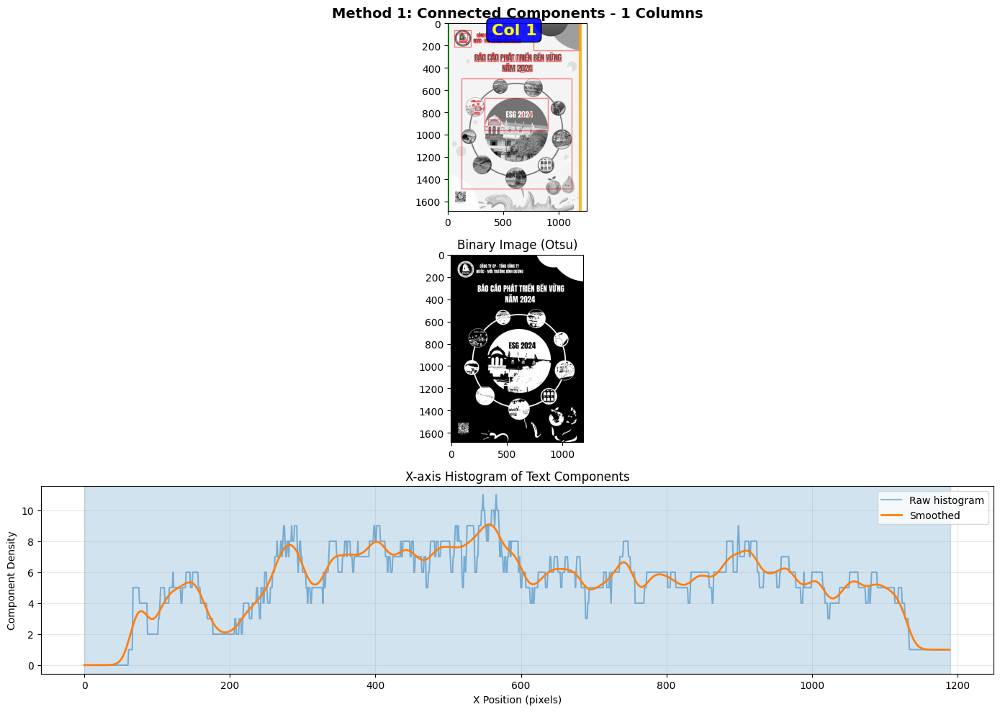

✅ Method 1 for page 1: 1 cột phát hiện


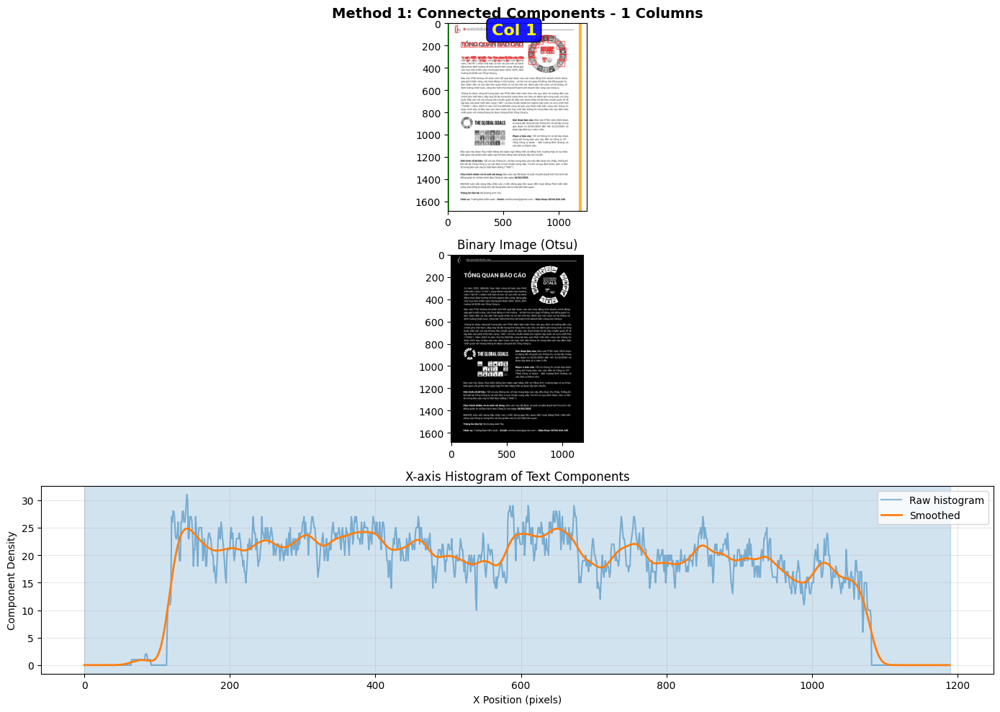

✅ Method 1 for page 2: 1 cột phát hiện


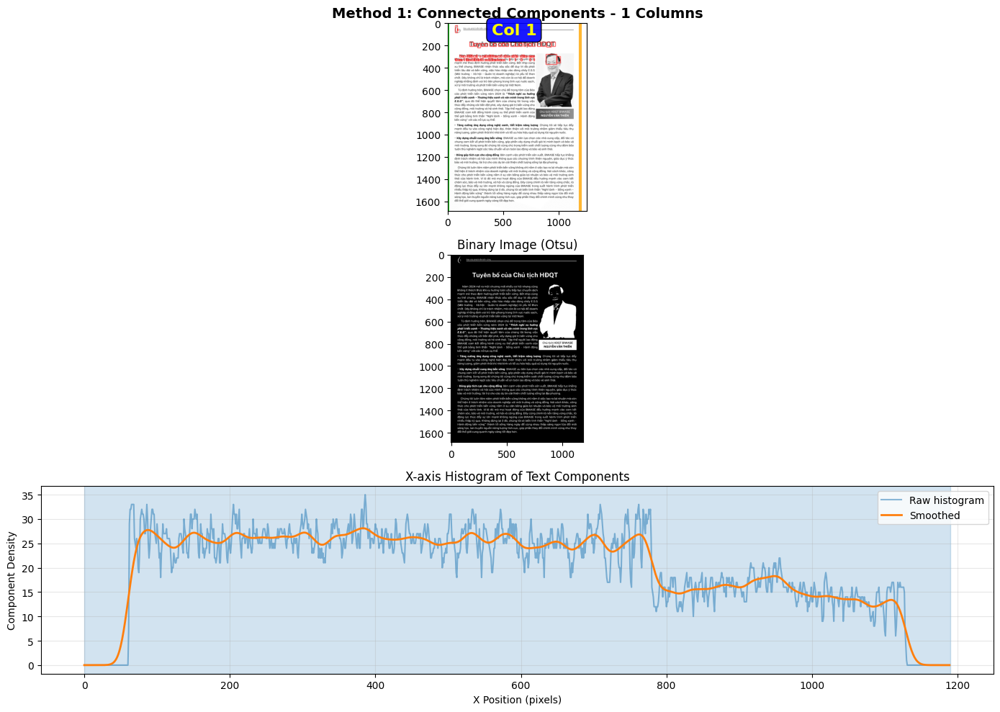

✅ Method 1 for page 3: 1 cột phát hiện


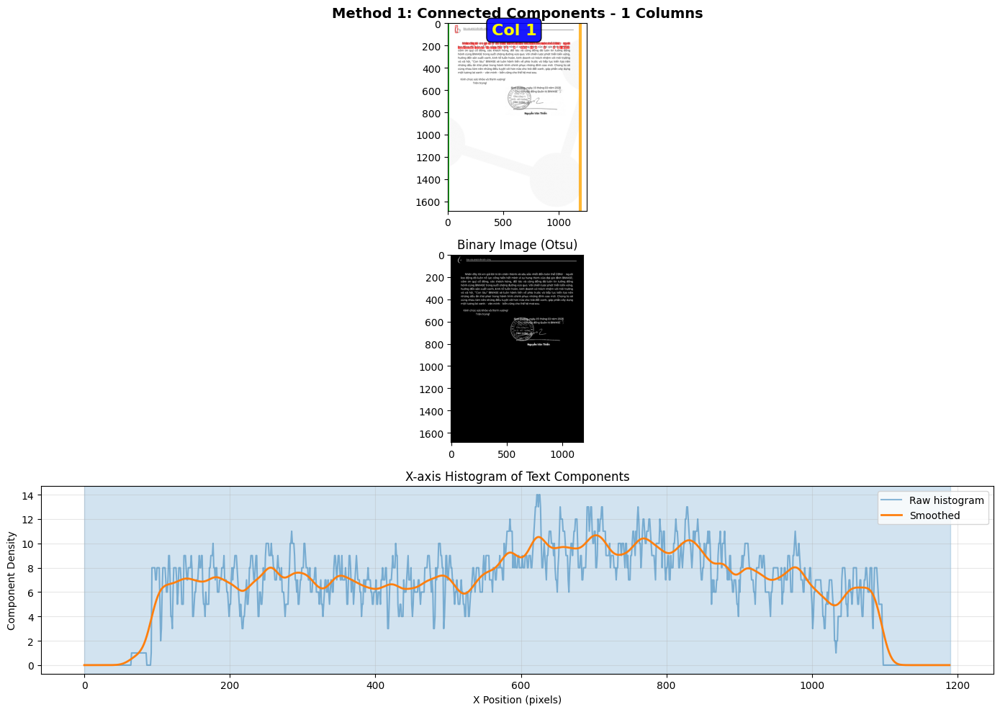

✅ Method 1 for page 4: 1 cột phát hiện


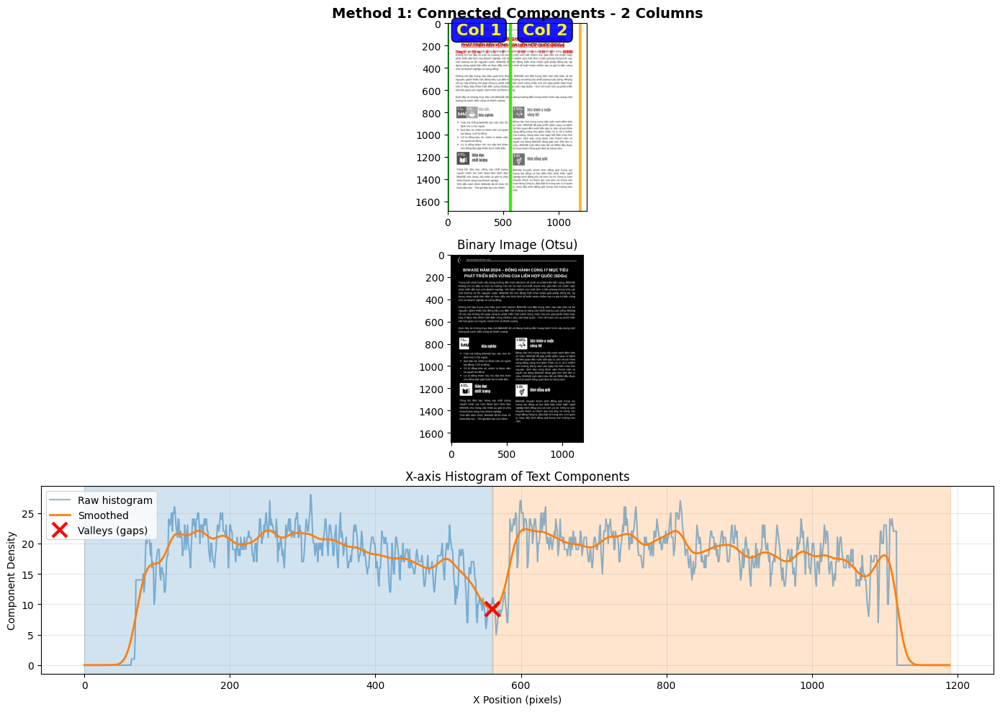

✅ Method 1 for page 5: 2 cột phát hiện


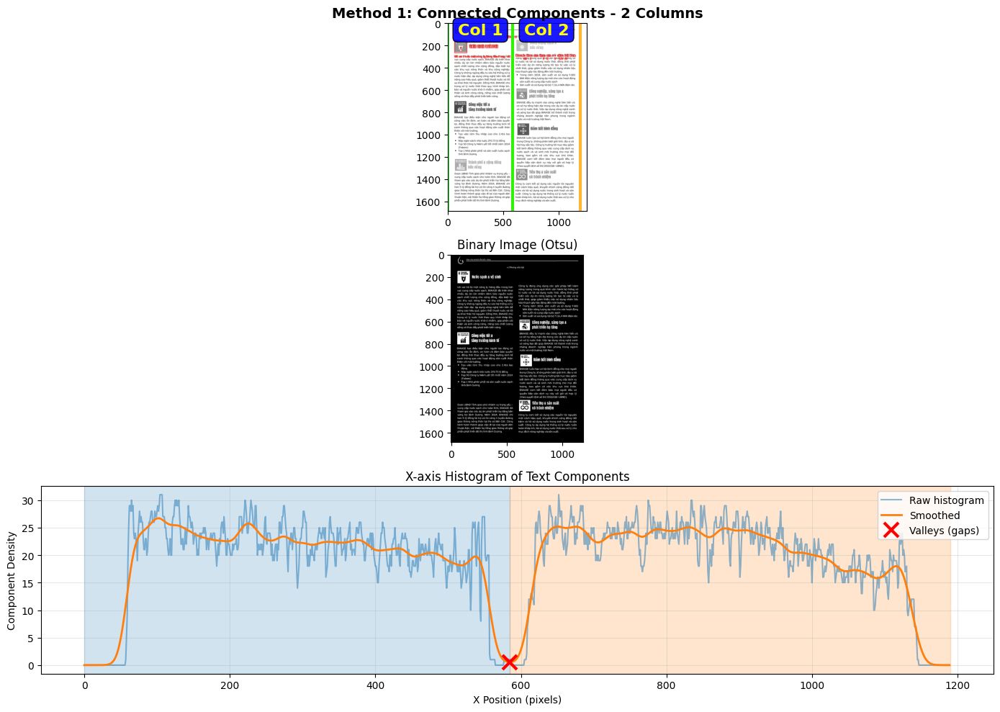

✅ Method 1 for page 6: 2 cột phát hiện


In [126]:
import numpy as np
import cv2
from PIL import Image
import io
import pymupdf
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from scipy.ndimage import gaussian_filter1d

# ============================================================================
# PHƯƠNG PHÁP 1: Connected Components Analysis (Phân tích vùng liên thông)
# ============================================================================
def method1_connected_components(pdf_path, page_number=0, debug=True):
    """
    Phát hiện số cột bằng phân tích vùng liên thông
    - Chuyển ảnh thành binary
    - Tìm các vùng text liên thông
    - Phân tích phân bố x để xác định cột
    """
    doc = pymupdf.open(pdf_path)
    page = doc[page_number]
    
    zoom = 2
    pix = page.get_pixmap(matrix=pymupdf.Matrix(zoom, zoom))
    img_pil = Image.open(io.BytesIO(pix.tobytes("png")))
    img_gray = np.array(img_pil.convert('L'))
    doc.close()
    
    height, width = img_gray.shape
    
    # Binarization (Otsu's method)
    _, binary = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    # Connected components
    num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(binary, connectivity=8)
    
    # Lọc các component có kích thước hợp lý (bỏ noise)
    min_area = 40
    valid_components = []
    for i in range(1, num_labels):  # Bỏ background (label 0)
        x, y, w, h, area = stats[i]
        if area > min_area and h > 10:  # Component có chiều cao hợp lý
            valid_components.append({
                'x': x,
                'y': y,
                'width': w,
                'height': h,
                'center_x': x + w/2,
                'center_y': y + h/2
            })
    
    # Phân tích histogram theo x
    x_histogram = np.zeros(width)
    for comp in valid_components:
        x_start = int(comp['x'])
        x_end = int(comp['x'] + comp['width'])
        x_histogram[x_start:x_end] += 1
    
    # Làm mượt histogram
    x_histogram_smooth = gaussian_filter1d(x_histogram, sigma=10)
    
    # Tìm vùng trống (valleys)
    inverted = -x_histogram_smooth
    valleys, _ = find_peaks(inverted, prominence=8, distance=100)
    
    # Xác định số cột
    num_columns = len(valleys) + 1
    
    # Xác định ranh giới
    column_boundaries = []
    if len(valleys) == 0:
        column_boundaries = [[0, width]]
    else:
        column_boundaries.append([0, valleys[0]])
        for i in range(len(valleys) - 1):
            column_boundaries.append([valleys[i], valleys[i+1]])
        column_boundaries.append([valleys[-1], width])
    
    if debug:
        fig, axes = plt.subplots(3, 1, figsize=(14, 10))
        
        # Ảnh gốc với components
        axes[0].imshow(img_gray, cmap='gray')
        for comp in valid_components[:100]:  # Hiển thị 100 components đầu
            rect = plt.Rectangle((comp['x'], comp['y']), comp['width'], comp['height'],
                                linewidth=1, edgecolor='red', facecolor='none', alpha=0.5)
            axes[0].add_patch(rect)
        
        # Vẽ ranh giới cột
        for i, (x_start, x_end) in enumerate(column_boundaries):
            axes[0].axvline(x=x_start, color='lime', linewidth=3, alpha=0.8)
            axes[0].axvline(x=x_end, color='orange', linewidth=3, alpha=0.8)
            col_center = (x_start + x_end) / 2
            axes[0].text(col_center, 100, f'Col {i+1}', 
                        color='yellow', fontsize=16, weight='bold',
                        bbox=dict(boxstyle='round', facecolor='blue', alpha=0.9),
                        ha='center')
        
        axes[0].set_title(f'Method 1: Connected Components - {num_columns} Columns', fontsize=14, weight='bold')
        
        # Binary image
        axes[1].imshow(binary, cmap='gray')
        axes[1].set_title('Binary Image (Otsu)', fontsize=12)
        
        # Histogram
        axes[2].plot(x_histogram, label='Raw histogram', alpha=0.5)
        axes[2].plot(x_histogram_smooth, label='Smoothed', linewidth=2)
        if len(valleys) > 0:
            axes[2].plot(valleys, x_histogram_smooth[valleys], 'rx', 
                        markersize=15, markeredgewidth=3, label='Valleys (gaps)')
        
        # Tô vùng cột
        for i, (x_start, x_end) in enumerate(column_boundaries):
            axes[2].axvspan(x_start, x_end, alpha=0.2, color=f'C{i}')
        
        axes[2].set_xlabel('X Position (pixels)')
        axes[2].set_ylabel('Component Density')
        axes[2].set_title('X-axis Histogram of Text Components')
        axes[2].legend()
        axes[2].grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
    
    return {
        'method': 'Connected Components',
        'num_columns': num_columns,
        'column_boundaries': column_boundaries,
        'components_count': len(valid_components)
    }

# Test
for i in range(6):
    pdf_path = f"../data/pdfs/pages/page_{i+1}.pdf"
    if i == 15:
        result1 = method1_connected_components(pdf_path, debug=True)
    else:
        result1 = method1_connected_components(pdf_path, debug=True)
    print(f"✅ Method 1 for page {i+1}: {result1['num_columns']} cột phát hiện")

✅ Method 2 for page 1: 2 cột phát hiện
✅ Method 2 for page 2: 3 cột phát hiện
✅ Method 2 for page 3: 3 cột phát hiện
✅ Method 2 for page 4: 3 cột phát hiện
✅ Method 2 for page 5: 3 cột phát hiện


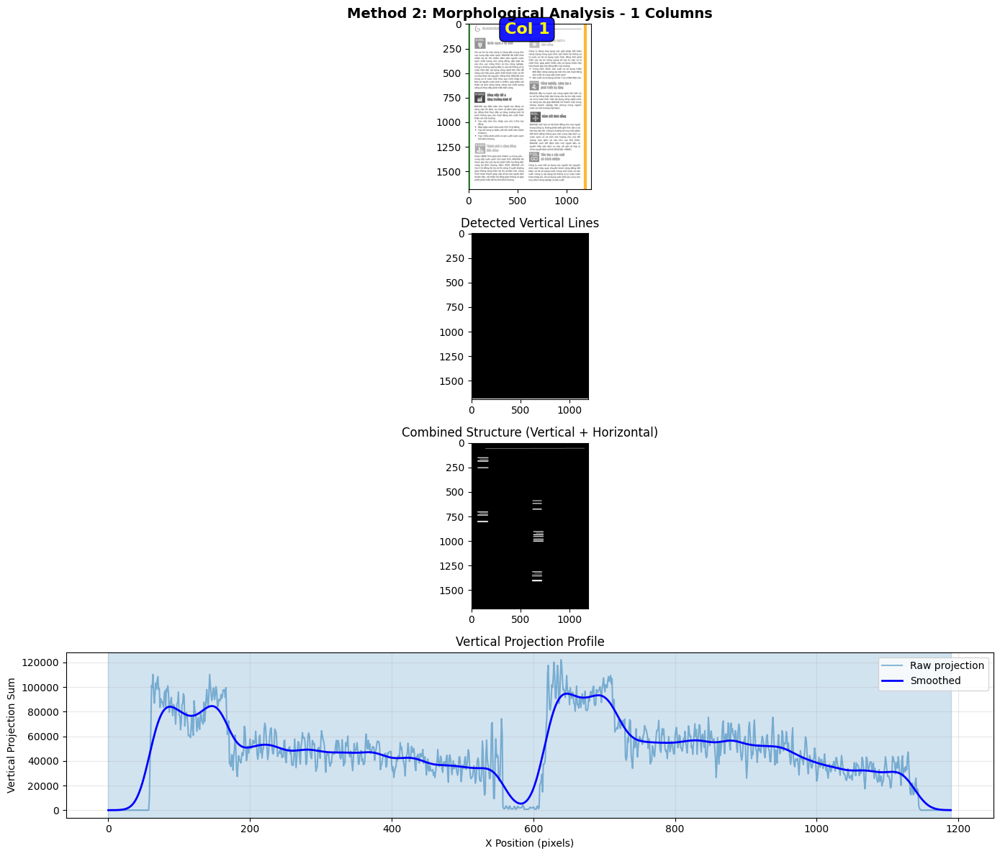

✅ Method 2 for page 6: 1 cột phát hiện
✅ Method 2 for page 7: 3 cột phát hiện
✅ Method 2 for page 8: 2 cột phát hiện
✅ Method 2 for page 9: 3 cột phát hiện
✅ Method 2 for page 10: 3 cột phát hiện
✅ Method 2 for page 11: 2 cột phát hiện
✅ Method 2 for page 12: 3 cột phát hiện
✅ Method 2 for page 13: 3 cột phát hiện
✅ Method 2 for page 14: 1 cột phát hiện
✅ Method 2 for page 15: 1 cột phát hiện
✅ Method 2 for page 16: 1 cột phát hiện
✅ Method 2 for page 17: 1 cột phát hiện
✅ Method 2 for page 18: 3 cột phát hiện
✅ Method 2 for page 19: 1 cột phát hiện
✅ Method 2 for page 20: 1 cột phát hiện


In [91]:
# ============================================================================
# PHƯƠNG PHÁP 2: Morphological Operations + Vertical Line Detection
# ============================================================================
def method2_morphological_analysis(pdf_path, page_number=0, debug=True):
    """
    Phát hiện số cột bằng phân tích hình thái học
    - Sử dụng morphological operations để tìm cấu trúc dọc
    - Phát hiện đường thẳng đứng (vertical lines) ngăn cách cột
    """
    doc = pymupdf.open(pdf_path)
    page = doc[page_number]
    
    zoom = 2
    pix = page.get_pixmap(matrix=pymupdf.Matrix(zoom, zoom))
    img_pil = Image.open(io.BytesIO(pix.tobytes("png")))
    img_gray = np.array(img_pil.convert('L'))
    doc.close()
    
    height, width = img_gray.shape
    
    # Binarization
    _, binary = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    # Phát hiện đường thẳng dọc (vertical lines)
    vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, height // 30))
    vertical_lines = cv2.morphologyEx(binary, cv2.MORPH_OPEN, vertical_kernel, iterations=2)
    
    # Phát hiện text blocks
    horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (width // 30, 1))
    horizontal_lines = cv2.morphologyEx(binary, cv2.MORPH_OPEN, horizontal_kernel, iterations=2)
    
    # Kết hợp để tìm cấu trúc
    combined = cv2.add(vertical_lines, horizontal_lines)
    
    # Phân tích vertical projection
    vertical_projection = np.sum(binary, axis=0)
    vertical_projection_smooth = gaussian_filter1d(vertical_projection, sigma=15)
    
    # Tìm valleys (khoảng trống)
    inverted = -vertical_projection_smooth
    valleys, properties = find_peaks(inverted, prominence=height*50, distance=100)
    
    # Lọc valleys có prominence cao
    if len(valleys) > 0:
        prominences = properties['prominences']
        threshold_prominence = np.mean(prominences) * 0.5
        significant_valleys = valleys[prominences > threshold_prominence]
    else:
        significant_valleys = []
    
    num_columns = len(significant_valleys) + 1
    
    # Xác định ranh giới
    column_boundaries = []
    if len(significant_valleys) == 0:
        column_boundaries = [[0, width]]
    else:
        column_boundaries.append([0, significant_valleys[0]])
        for i in range(len(significant_valleys) - 1):
            column_boundaries.append([significant_valleys[i], significant_valleys[i+1]])
        column_boundaries.append([significant_valleys[-1], width])
    
    if debug:
        fig, axes = plt.subplots(4, 1, figsize=(14, 12))
        
        # Ảnh gốc
        axes[0].imshow(img_gray, cmap='gray')
        for i, (x_start, x_end) in enumerate(column_boundaries):
            axes[0].axvline(x=x_start, color='lime', linewidth=3, alpha=0.8)
            axes[0].axvline(x=x_end, color='orange', linewidth=3, alpha=0.8)
            col_center = (x_start + x_end) / 2
            axes[0].text(col_center, 100, f'Col {i+1}', 
                        color='yellow', fontsize=16, weight='bold',
                        bbox=dict(boxstyle='round', facecolor='blue', alpha=0.9),
                        ha='center')
        axes[0].set_title(f'Method 2: Morphological Analysis - {num_columns} Columns', fontsize=14, weight='bold')
        
        # Vertical lines
        axes[1].imshow(vertical_lines, cmap='gray')
        axes[1].set_title('Detected Vertical Lines', fontsize=12)
        
        # Combined structure
        axes[2].imshow(combined, cmap='gray')
        axes[2].set_title('Combined Structure (Vertical + Horizontal)', fontsize=12)
        
        # Vertical projection
        axes[3].plot(vertical_projection, label='Raw projection', alpha=0.5)
        axes[3].plot(vertical_projection_smooth, label='Smoothed', linewidth=2, color='blue')
        if len(significant_valleys) > 0:
            axes[3].plot(significant_valleys, vertical_projection_smooth[significant_valleys], 
                        'rx', markersize=15, markeredgewidth=3, label='Significant valleys')
        
        # Tô vùng cột
        for i, (x_start, x_end) in enumerate(column_boundaries):
            axes[3].axvspan(x_start, x_end, alpha=0.2, color=f'C{i}')
        
        axes[3].set_xlabel('X Position (pixels)')
        axes[3].set_ylabel('Vertical Projection Sum')
        axes[3].set_title('Vertical Projection Profile')
        axes[3].legend()
        axes[3].grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
    
    return {
        'method': 'Morphological Analysis',
        'num_columns': num_columns,
        'column_boundaries': column_boundaries,
        'valleys_count': len(significant_valleys)
    }

# Test
for i in range(20):
    pdf_path = f"../data/pdfs/pages/page_{i+1}.pdf"
    result2 = method2_morphological_analysis(pdf_path, debug=True if i==5 else False)
    print(f"✅ Method 2 for page {i+1}: {result2['num_columns']} cột phát hiện")


📄 Phân tích trang 1


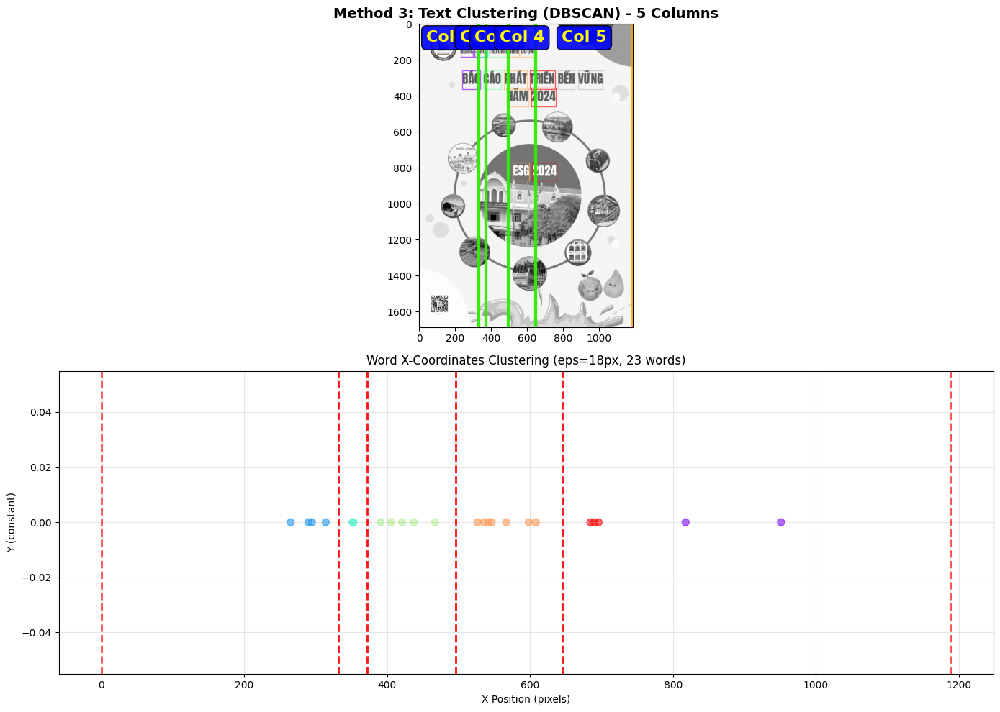


✅ Method 3: 5 cột phát hiện
📊 Số words: 23

📄 Phân tích trang 2


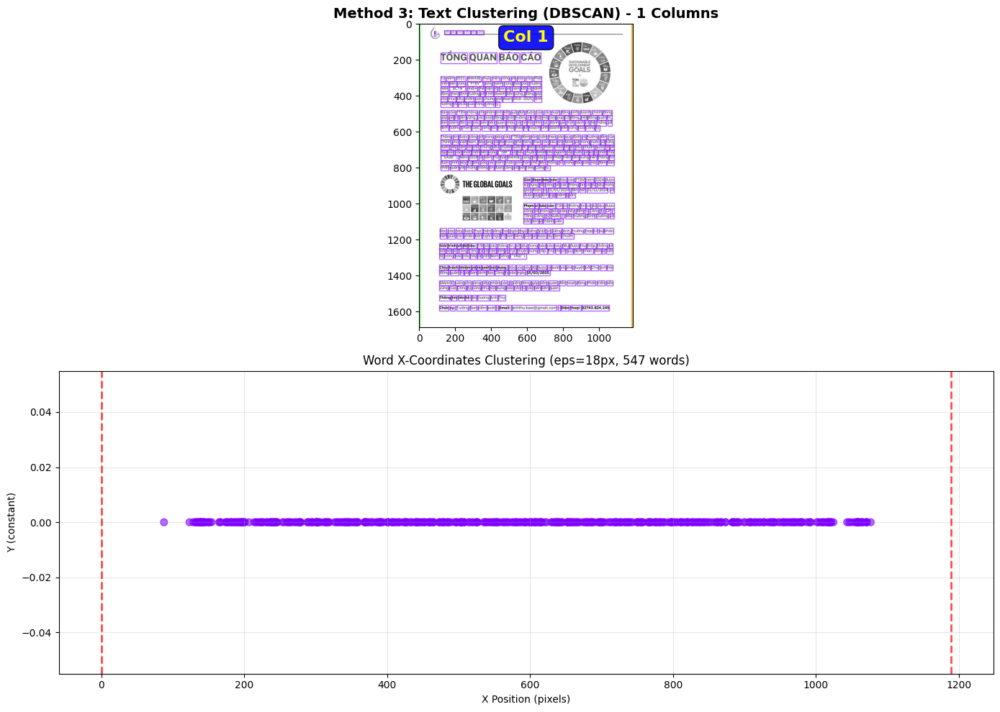


✅ Method 3: 1 cột phát hiện
📊 Số words: 547

📄 Phân tích trang 3


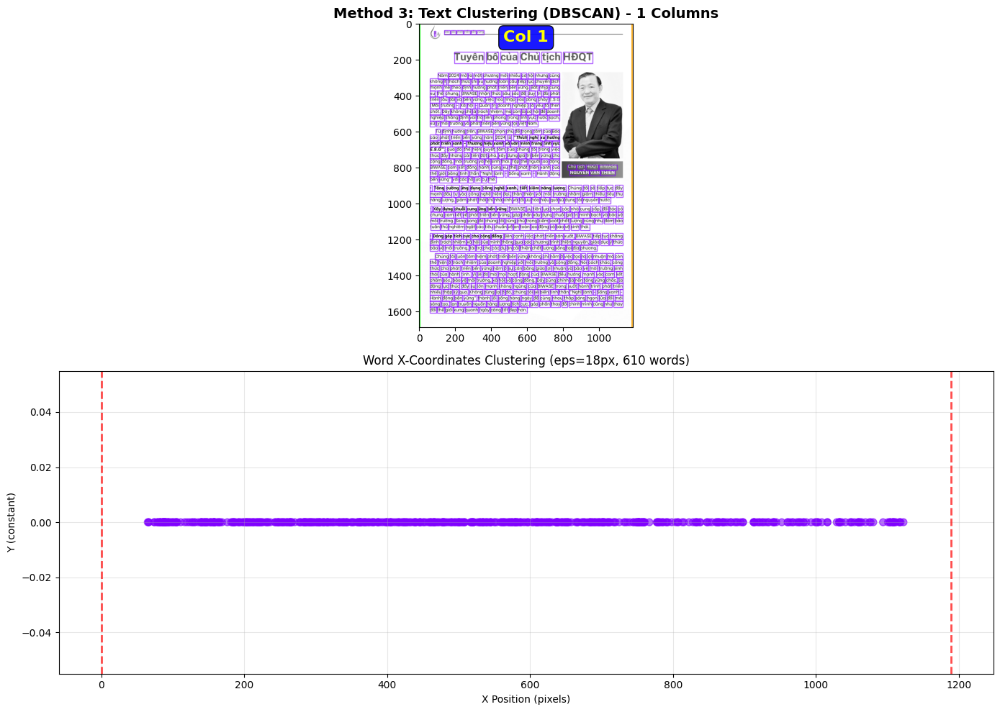


✅ Method 3: 1 cột phát hiện
📊 Số words: 610

📄 Phân tích trang 4


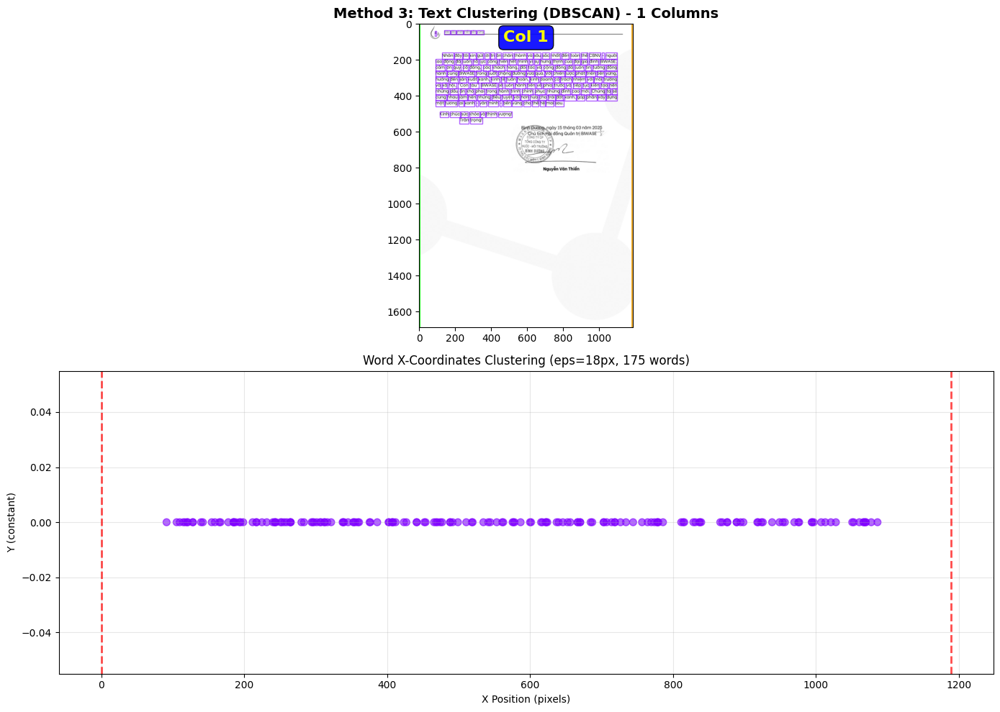


✅ Method 3: 1 cột phát hiện
📊 Số words: 175

📄 Phân tích trang 5


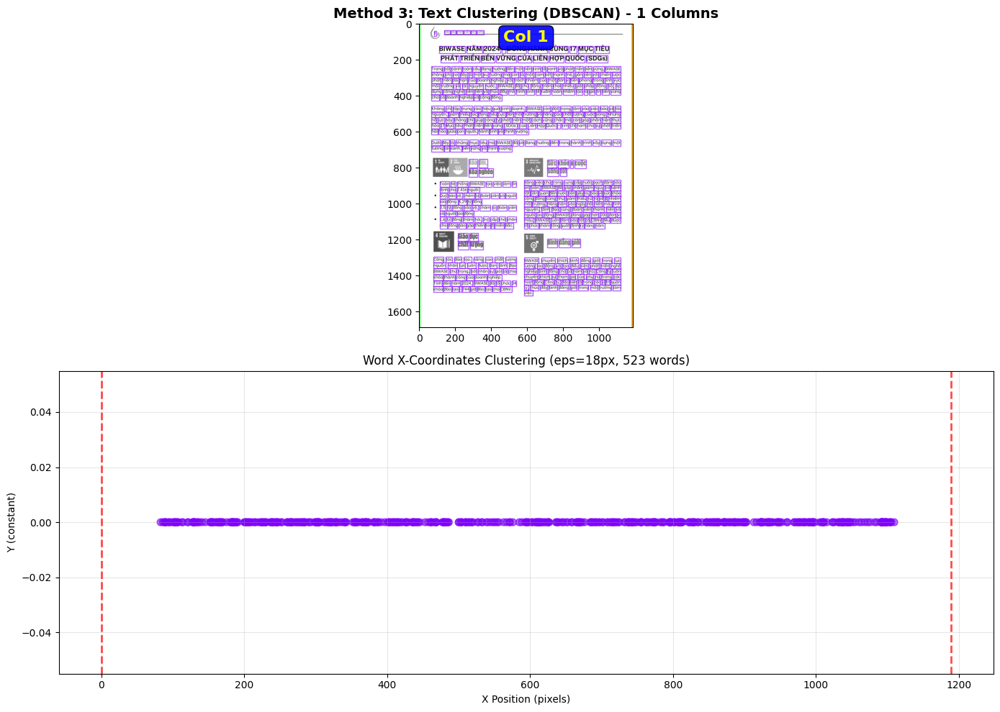


✅ Method 3: 1 cột phát hiện
📊 Số words: 523

📄 Phân tích trang 6


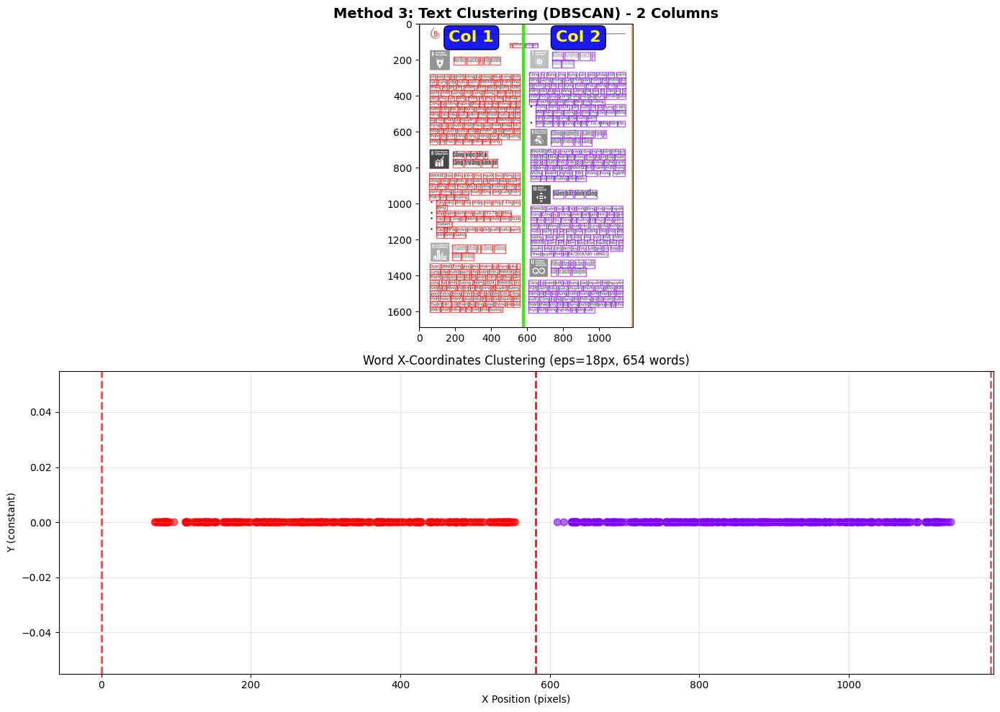


✅ Method 3: 2 cột phát hiện
📊 Số words: 654

📄 Phân tích trang 7


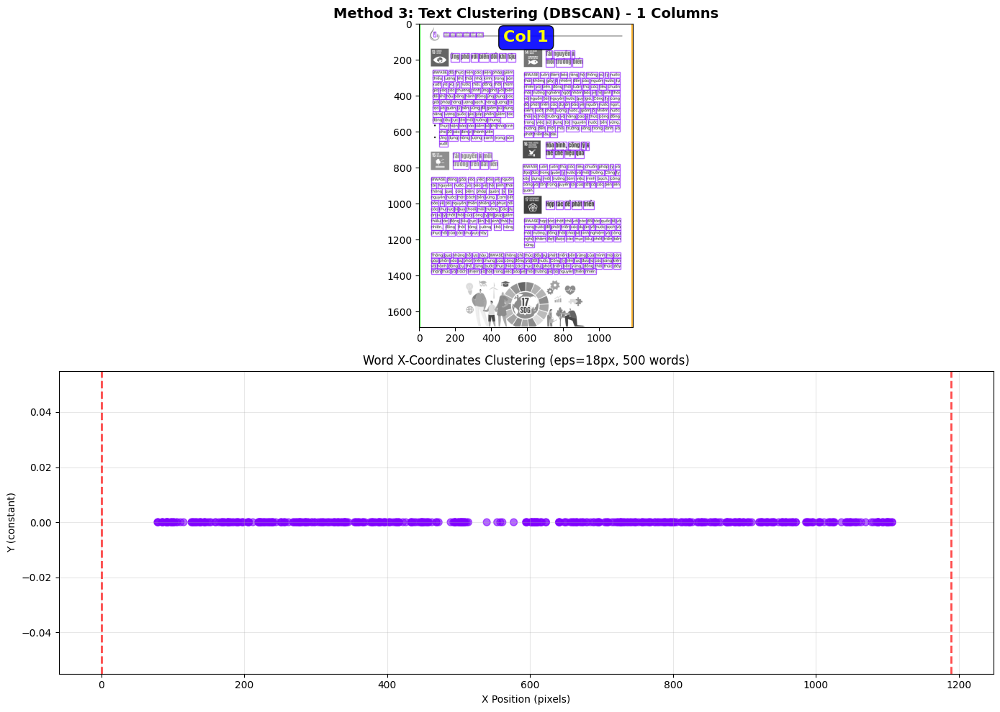


✅ Method 3: 1 cột phát hiện
📊 Số words: 500

📄 Phân tích trang 8


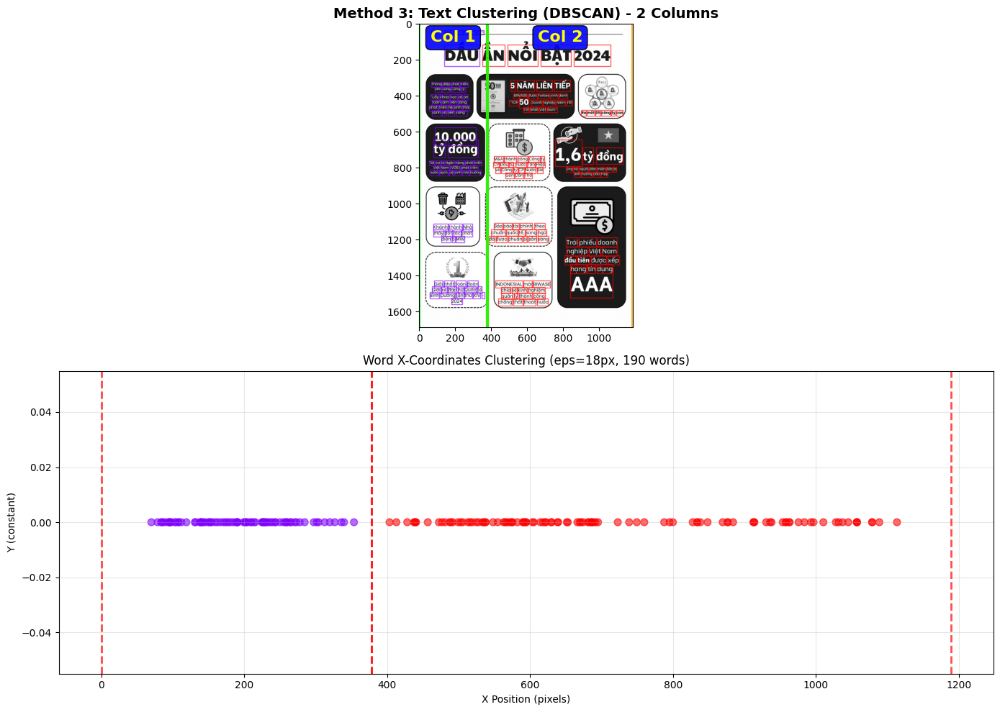


✅ Method 3: 2 cột phát hiện
📊 Số words: 190

📄 Phân tích trang 9


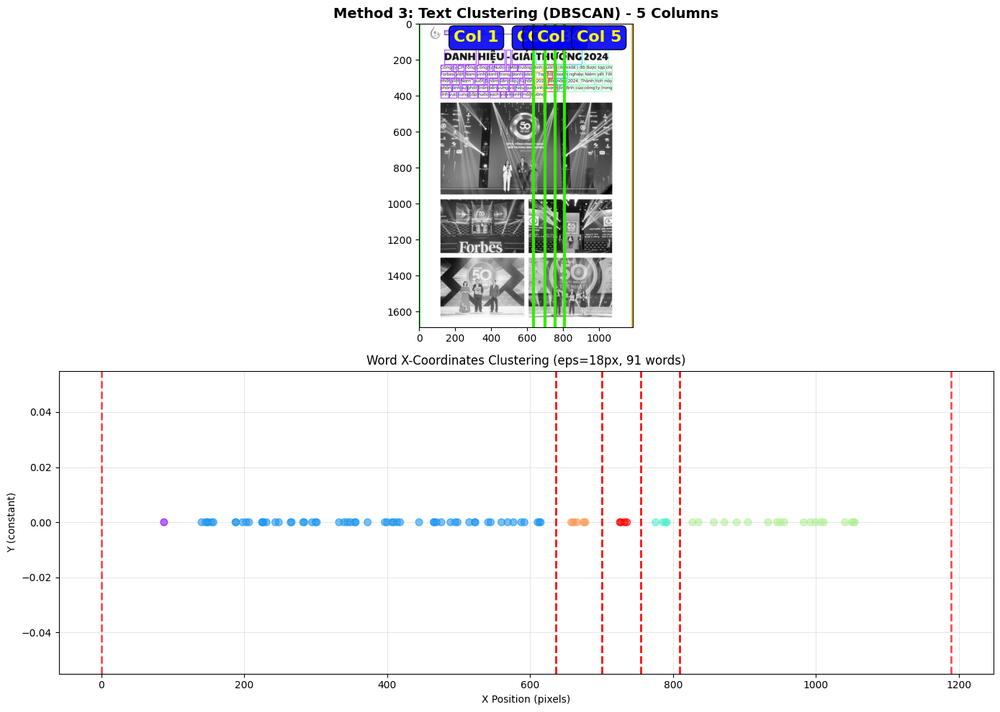


✅ Method 3: 5 cột phát hiện
📊 Số words: 91

📄 Phân tích trang 10


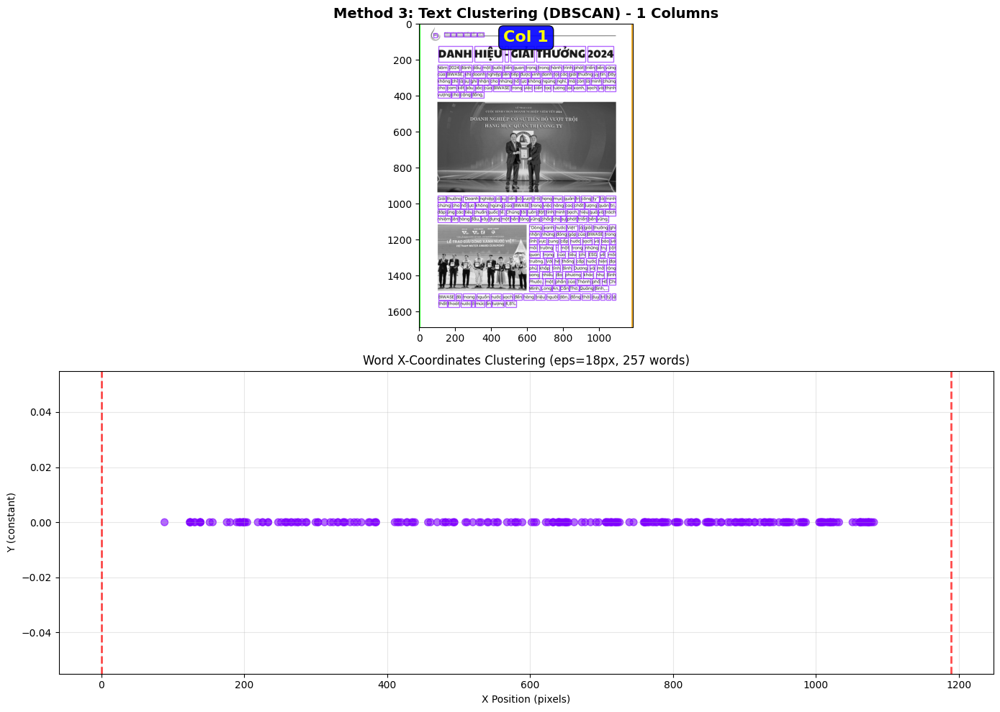


✅ Method 3: 1 cột phát hiện
📊 Số words: 257


In [92]:
# ============================================================================
# PHƯƠNG PHÁP 3: Clustering-based (DBSCAN) trên tọa độ text
# ============================================================================
def method3_text_clustering(pdf_path, page_number=0, debug=True):
    """
    Phát hiện số cột bằng clustering trên tọa độ text
    - Lấy tọa độ x của tất cả các từ
    - Sử dụng DBSCAN để nhóm thành các cột
    """
    from sklearn.cluster import DBSCAN
    
    doc = pymupdf.open(pdf_path)
    page = doc[page_number]
    
    # Lấy words với tọa độ
    words = page.get_text("words")
    
    # Render ảnh để visualization
    zoom = 2
    pix = page.get_pixmap(matrix=pymupdf.Matrix(zoom, zoom))
    img_pil = Image.open(io.BytesIO(pix.tobytes("png")))
    img_gray = np.array(img_pil.convert('L'))
    
    rect = page.rect
    page_width = rect.width
    page_height = rect.height
    doc.close()
    
    if len(words) == 0:
        return {
            'method': 'Text Clustering (DBSCAN)',
            'num_columns': 1,
            'column_boundaries': [[0, int(page_width * 2)]],
            'words_count': 0
        }
    
    # Lấy tọa độ x trung tâm của mỗi từ
    x_centers = np.array([(w[0] + w[2]) / 2 for w in words]).reshape(-1, 1)
    
    # Scale to image coordinates
    x_centers_scaled = x_centers * 2  # zoom = 2
    
    # DBSCAN clustering
    # eps: khoảng cách tối đa giữa 2 điểm trong cùng cluster
    # min_samples: số điểm tối thiểu để tạo cluster
    eps = page_width * 0.03  # 10% độ rộng trang
    clustering = DBSCAN(eps=eps, min_samples=2).fit(x_centers)
    labels = clustering.labels_
    
    # Số cluster (không tính noise = -1)
    unique_labels = set(labels)
    if -1 in unique_labels:
        unique_labels.remove(-1)
    
    num_columns = len(unique_labels)
    
    if num_columns == 0:
        num_columns = 1
        column_boundaries = [[0, int(page_width * 2)]]
    else:
        # Xác định ranh giới dựa trên cluster centers
        cluster_centers = []
        for label in sorted(unique_labels):
            cluster_points = x_centers_scaled[labels == label]
            center = np.mean(cluster_points)
            min_x = np.min(cluster_points)
            max_x = np.max(cluster_points)
            cluster_centers.append({
                'label': label,
                'center': center,
                'min': min_x,
                'max': max_x
            })
        
        # Sắp xếp theo center
        cluster_centers.sort(key=lambda c: c['center'])
        
        # Xác định ranh giới
        column_boundaries = []
        for i, cluster in enumerate(cluster_centers):
            if i == 0:
                x_start = 0
            else:
                # Ranh giới là điểm giữa 2 cluster
                x_start = int((cluster_centers[i-1]['max'] + cluster['min']) / 2)
            
            if i == len(cluster_centers) - 1:
                x_end = int(page_width * 2)
            else:
                x_end = int((cluster['max'] + cluster_centers[i+1]['min']) / 2)
            
            column_boundaries.append([x_start, x_end])
    
    if debug:
        fig, axes = plt.subplots(2, 1, figsize=(14, 10))
        
        # Ảnh gốc với words colored by cluster
        axes[0].imshow(img_gray, cmap='gray')
        
        # Vẽ words với màu theo cluster
        colors_map = plt.cm.rainbow(np.linspace(0, 1, num_columns))
        for i, word in enumerate(words):
            x0, y0, x1, y1 = word[0] * 2, word[1] * 2, word[2] * 2, word[3] * 2
            label = labels[i]
            if label == -1:  # Noise
                color = 'gray'
                alpha = 0.3
            else:
                color = colors_map[label]
                alpha = 0.6
            rect = plt.Rectangle((x0, y0), x1-x0, y1-y0,
                                linewidth=1, edgecolor=color, facecolor='none', alpha=alpha)
            axes[0].add_patch(rect)
        
        # Vẽ ranh giới cột
        for i, (x_start, x_end) in enumerate(column_boundaries):
            axes[0].axvline(x=x_start, color='lime', linewidth=3, alpha=0.8)
            axes[0].axvline(x=x_end, color='orange', linewidth=3, alpha=0.8)
            col_center = (x_start + x_end) / 2
            axes[0].text(col_center, 100, f'Col {i+1}', 
                        color='yellow', fontsize=16, weight='bold',
                        bbox=dict(boxstyle='round', facecolor='blue', alpha=0.9),
                        ha='center')
        
        axes[0].set_title(f'Method 3: Text Clustering (DBSCAN) - {num_columns} Columns', fontsize=14, weight='bold')
        
        # Scatter plot của x coordinates với màu cluster
        axes[1].scatter(x_centers_scaled, np.zeros_like(x_centers_scaled), 
                       c=labels, cmap='rainbow', s=50, alpha=0.6)
        axes[1].set_xlabel('X Position (pixels)')
        axes[1].set_ylabel('Y (constant)')
        axes[1].set_title(f'Word X-Coordinates Clustering (eps={eps:.0f}px, {len(words)} words)')
        
        # Vẽ ranh giới cột
        for x_start, x_end in column_boundaries:
            axes[1].axvline(x=x_start, color='red', linestyle='--', linewidth=2, alpha=0.7)
            axes[1].axvline(x=x_end, color='red', linestyle='--', linewidth=2, alpha=0.7)
        
        axes[1].grid(True, alpha=0.3)
        
        plt.tight_layout()
        plt.show()
    
    return {
        'method': 'Text Clustering (DBSCAN)',
        'num_columns': num_columns,
        'column_boundaries': column_boundaries,
        'words_count': len(words)
    }

# Test
pdf_path = "../data/pdfs/file_2.pdf"
for i in range(10):
    print(f"\n{'='*80}\n📄 Phân tích trang {i+1}")
    result3 = method3_text_clustering(pdf_path, page_number=i, debug=True)
    print(f"\n✅ Method 3: {result3['num_columns']} cột phát hiện")
    print(f"📊 Số words: {result3['words_count']}")

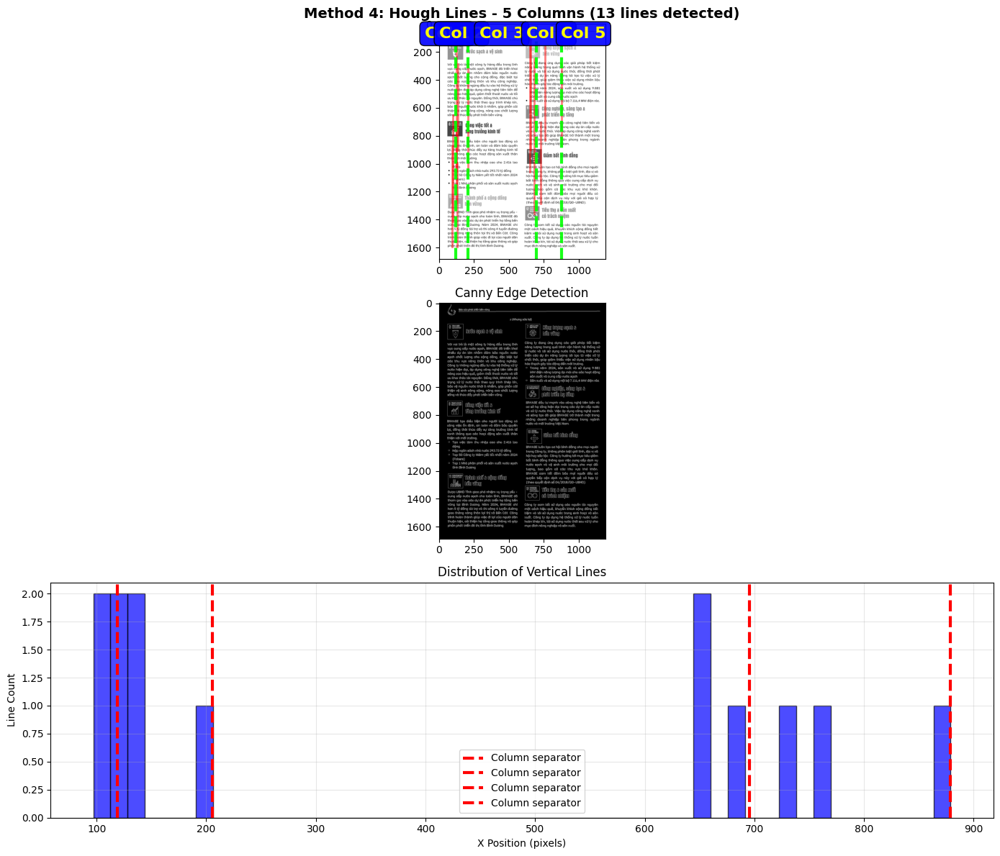


✅ Method 4: 5 cột phát hiện
📊 Số đường thẳng dọc: 13
📊 Số nhóm: 4


In [9]:
# ============================================================================
# PHƯƠNG PHÁP 4: Hough Transform để phát hiện đường thẳng dọc
# ============================================================================
def method4_hough_lines(pdf_path, page_number=0, debug=True):
    """
    Phát hiện số cột bằng Hough Transform
    - Phát hiện các đường thẳng dọc trong ảnh
    - Đường thẳng dọc thường ngăn cách giữa các cột
    """
    doc = pymupdf.open(pdf_path)
    page = doc[page_number]
    
    zoom = 2
    pix = page.get_pixmap(matrix=pymupdf.Matrix(zoom, zoom))
    img_pil = Image.open(io.BytesIO(pix.tobytes("png")))
    img_gray = np.array(img_pil.convert('L'))
    doc.close()
    
    height, width = img_gray.shape
    
    # Edge detection
    edges = cv2.Canny(img_gray, 50, 150, apertureSize=3)
    
    # Hough Line Transform (probabilistic)
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=100, 
                            minLineLength=height//3, maxLineGap=50)
    
    # Lọc đường thẳng dọc
    vertical_lines = []
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            angle = np.abs(np.arctan2(y2 - y1, x2 - x1) * 180 / np.pi)
            
            # Đường thẳng dọc có góc gần 90 độ
            if angle > 85 and angle < 95:
                vertical_lines.append({
                    'x': (x1 + x2) / 2,
                    'y1': min(y1, y2),
                    'y2': max(y1, y2),
                    'length': abs(y2 - y1)
                })
    
    # Nhóm các đường thẳng gần nhau
    if len(vertical_lines) > 0:
        vertical_lines.sort(key=lambda l: l['x'])
        
        grouped_lines = []
        current_group = [vertical_lines[0]]
        
        for line in vertical_lines[1:]:
            if line['x'] - current_group[-1]['x'] < 50:  # Gần nhau
                current_group.append(line)
            else:
                # Tính trung bình group
                avg_x = np.mean([l['x'] for l in current_group])
                grouped_lines.append(avg_x)
                current_group = [line]
        
        # Group cuối
        if current_group:
            avg_x = np.mean([l['x'] for l in current_group])
            grouped_lines.append(avg_x)
    else:
        grouped_lines = []
    
    # Xác định số cột
    num_columns = len(grouped_lines) + 1
    
    # Xác định ranh giới
    column_boundaries = []
    if len(grouped_lines) == 0:
        column_boundaries = [[0, width]]
    else:
        column_boundaries.append([0, int(grouped_lines[0])])
        for i in range(len(grouped_lines) - 1):
            column_boundaries.append([int(grouped_lines[i]), int(grouped_lines[i+1])])
        column_boundaries.append([int(grouped_lines[-1]), width])
    
    if debug:
        fig, axes = plt.subplots(3, 1, figsize=(14, 12))
        
        # Ảnh gốc với đường thẳng phát hiện
        axes[0].imshow(img_gray, cmap='gray')
        
        # Vẽ tất cả vertical lines
        for line in vertical_lines:
            axes[0].plot([line['x'], line['x']], [line['y1'], line['y2']], 
                        'r-', linewidth=2, alpha=0.5)
        
        # Vẽ grouped lines (ranh giới cột)
        for x in grouped_lines:
            axes[0].axvline(x=x, color='lime', linewidth=3, alpha=0.9, linestyle='--')
        
        # Vẽ ranh giới cột
        for i, (x_start, x_end) in enumerate(column_boundaries):
            col_center = (x_start + x_end) / 2
            axes[0].text(col_center, 100, f'Col {i+1}', 
                        color='yellow', fontsize=16, weight='bold',
                        bbox=dict(boxstyle='round', facecolor='blue', alpha=0.9),
                        ha='center')
        
        axes[0].set_title(f'Method 4: Hough Lines - {num_columns} Columns ({len(vertical_lines)} lines detected)', 
                         fontsize=14, weight='bold')
        
        # Edges
        axes[1].imshow(edges, cmap='gray')
        axes[1].set_title('Canny Edge Detection', fontsize=12)
        
        # Histogram của x positions của vertical lines
        if len(vertical_lines) > 0:
            x_positions = [l['x'] for l in vertical_lines]
            axes[2].hist(x_positions, bins=50, alpha=0.7, color='blue', edgecolor='black')
            
            for x in grouped_lines:
                axes[2].axvline(x=x, color='red', linewidth=3, linestyle='--', 
                               label='Column separator')
            
            axes[2].set_xlabel('X Position (pixels)')
            axes[2].set_ylabel('Line Count')
            axes[2].set_title('Distribution of Vertical Lines')
            axes[2].legend()
            axes[2].grid(True, alpha=0.3)
        else:
            axes[2].text(0.5, 0.5, 'No vertical lines detected', 
                        ha='center', va='center', fontsize=14, transform=axes[2].transAxes)
            axes[2].set_title('No Vertical Lines Found')
        
        plt.tight_layout()
        plt.show()
    
    return {
        'method': 'Hough Transform',
        'num_columns': num_columns,
        'column_boundaries': column_boundaries,
        'vertical_lines_count': len(vertical_lines),
        'grouped_lines_count': len(grouped_lines)
    }

# Test
result4 = method4_hough_lines(pdf_path, debug=True)
print(f"\n✅ Method 4: {result4['num_columns']} cột phát hiện")
print(f"📊 Số đường thẳng dọc: {result4['vertical_lines_count']}")
print(f"📊 Số nhóm: {result4['grouped_lines_count']}")

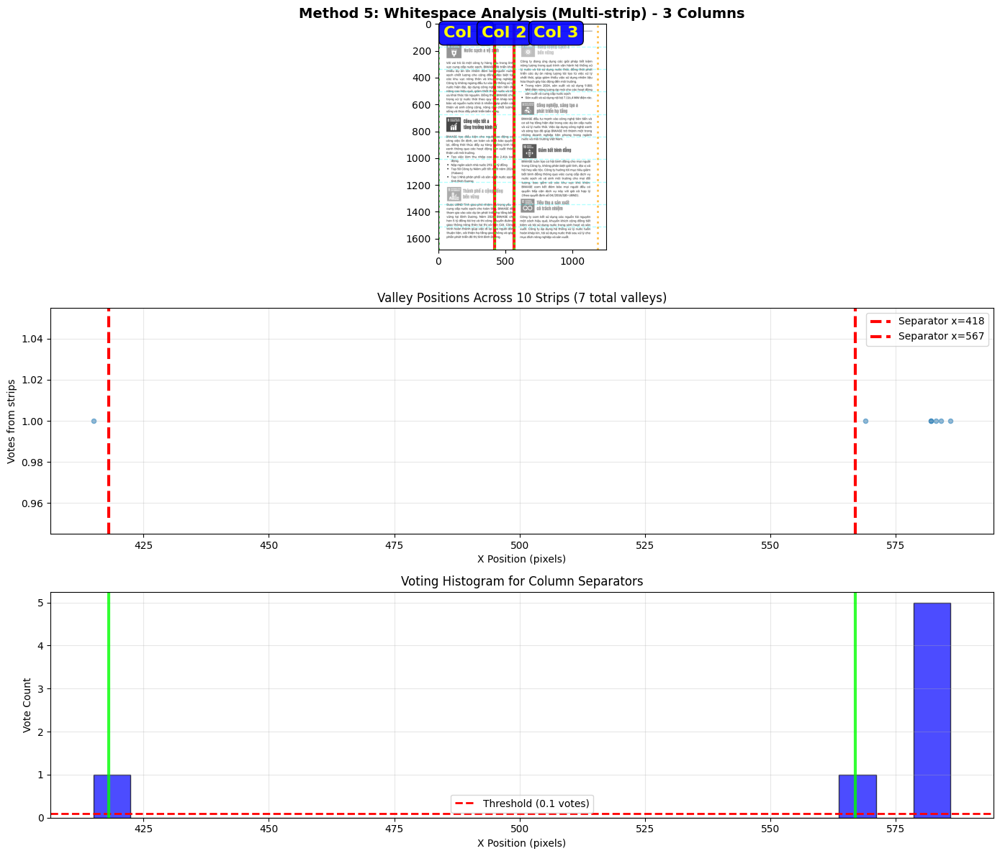


✅ Method 5: 3 cột phát hiện
📊 Tổng valleys: 7
📊 Separators: 2


In [10]:
# ============================================================================
# PHƯƠNG PHÁP 5: Whitespace Analysis với Adaptive Thresholding
# ============================================================================
def method5_whitespace_analysis(pdf_path, page_number=0, debug=True):
    """
    Phát hiện số cột bằng phân tích khoảng trắng với adaptive threshold
    - Chia trang thành nhiều vùng ngang
    - Phân tích projection profile ở mỗi vùng
    - Voting mechanism để xác định cột
    """
    doc = pymupdf.open(pdf_path)
    page = doc[page_number]
    
    zoom = 2
    pix = page.get_pixmap(matrix=pymupdf.Matrix(zoom, zoom))
    img_pil = Image.open(io.BytesIO(pix.tobytes("png")))
    img_gray = np.array(img_pil.convert('L'))
    doc.close()
    
    height, width = img_gray.shape
    
    # Chia thành nhiều horizontal strips
    num_strips = 10
    strip_height = height // num_strips
    
    all_valleys = []
    
    for i in range(num_strips):
        start_y = i * strip_height
        end_y = (i + 1) * strip_height if i < num_strips - 1 else height
        
        strip = img_gray[start_y:end_y, :]
        
        # Projection profile cho strip này
        projection = np.sum(strip < 240, axis=0)
        
        if projection.max() == 0:
            continue
        
        projection_norm = projection / projection.max()
        
        # Làm mượt
        projection_smooth = gaussian_filter1d(projection_norm, sigma=10)
        
        # Tìm valleys
        inverted = -projection_smooth
        valleys, properties = find_peaks(inverted, prominence=0.3, distance=100)
        
        # Lọc valleys có prominence cao
        if len(valleys) > 0:
            prominences = properties['prominences']
            significant = valleys[prominences > 0.4]
            all_valleys.extend(significant)
    
    # Voting: tìm vị trí x xuất hiện nhiều nhất
    if len(all_valleys) > 0:
        # Histogram voting
        hist, bin_edges = np.histogram(all_valleys, bins=width//50)
        
        # Tìm bins có votes cao
        threshold_votes = len(all_valleys) * 0.3 / (width//50)  # 30% strips phải có valley
        significant_bins = np.where(hist >= threshold_votes)[0]
        
        # Chuyển bins thành x positions
        column_separators = []
        for bin_idx in significant_bins:
            x_pos = int((bin_edges[bin_idx] + bin_edges[bin_idx + 1]) / 2)
            column_separators.append(x_pos)
        
        # Merge các separators gần nhau
        if len(column_separators) > 0:
            column_separators.sort()
            merged_separators = [column_separators[0]]
            
            for sep in column_separators[1:]:
                if sep - merged_separators[-1] > 100:  # Cách nhau ít nhất 100px
                    merged_separators.append(sep)
        else:
            merged_separators = []
    else:
        merged_separators = []
    
    # Xác định số cột
    num_columns = len(merged_separators) + 1
    
    # Xác định ranh giới
    column_boundaries = []
    if len(merged_separators) == 0:
        column_boundaries = [[0, width]]
    else:
        column_boundaries.append([0, merged_separators[0]])
        for i in range(len(merged_separators) - 1):
            column_boundaries.append([merged_separators[i], merged_separators[i+1]])
        column_boundaries.append([merged_separators[-1], width])
    
    if debug:
        fig, axes = plt.subplots(3, 1, figsize=(14, 12))
        
        # Ảnh gốc với strips và ranh giới
        axes[0].imshow(img_gray, cmap='gray')
        
        # Vẽ strips
        for i in range(num_strips):
            y = i * strip_height
            axes[0].axhline(y=y, color='cyan', linewidth=1, alpha=0.3, linestyle='--')
        
        # Vẽ column separators
        for sep in merged_separators:
            axes[0].axvline(x=sep, color='red', linewidth=3, alpha=0.9)
        
        # Vẽ ranh giới cột
        for i, (x_start, x_end) in enumerate(column_boundaries):
            axes[0].axvline(x=x_start, color='lime', linewidth=2, alpha=0.7, linestyle=':')
            axes[0].axvline(x=x_end, color='orange', linewidth=2, alpha=0.7, linestyle=':')
            col_center = (x_start + x_end) / 2
            axes[0].text(col_center, 100, f'Col {i+1}', 
                        color='yellow', fontsize=16, weight='bold',
                        bbox=dict(boxstyle='round', facecolor='blue', alpha=0.9),
                        ha='center')
        
        axes[0].set_title(f'Method 5: Whitespace Analysis (Multi-strip) - {num_columns} Columns', 
                         fontsize=14, weight='bold')
        
        # Scatter plot của all valleys
        if len(all_valleys) > 0:
            axes[1].scatter(all_valleys, np.ones(len(all_valleys)), alpha=0.5, s=20)
            for sep in merged_separators:
                axes[1].axvline(x=sep, color='red', linewidth=3, linestyle='--', 
                               label=f'Separator x={sep}')
            axes[1].set_xlabel('X Position (pixels)')
            axes[1].set_ylabel('Votes from strips')
            axes[1].set_title(f'Valley Positions Across {num_strips} Strips ({len(all_valleys)} total valleys)')
            axes[1].legend()
            axes[1].grid(True, alpha=0.3)
        else:
            axes[1].text(0.5, 0.5, 'No valleys detected', 
                        ha='center', va='center', fontsize=14, transform=axes[1].transAxes)
        
        # Histogram voting
        if len(all_valleys) > 0:
            axes[2].hist(all_valleys, bins=width//50, alpha=0.7, color='blue', edgecolor='black')
            axes[2].axhline(y=threshold_votes, color='red', linewidth=2, linestyle='--', 
                           label=f'Threshold ({threshold_votes:.1f} votes)')
            
            for sep in merged_separators:
                axes[2].axvline(x=sep, color='lime', linewidth=3, alpha=0.8)
            
            axes[2].set_xlabel('X Position (pixels)')
            axes[2].set_ylabel('Vote Count')
            axes[2].set_title('Voting Histogram for Column Separators')
            axes[2].legend()
            axes[2].grid(True, alpha=0.3)
        else:
            axes[2].text(0.5, 0.5, 'No valleys detected', 
                        ha='center', va='center', fontsize=14, transform=axes[2].transAxes)
        
        plt.tight_layout()
        plt.show()
    
    return {
        'method': 'Whitespace Analysis (Multi-strip Voting)',
        'num_columns': num_columns,
        'column_boundaries': column_boundaries,
        'total_valleys': len(all_valleys),
        'separators': len(merged_separators)
    }

# Test
result5 = method5_whitespace_analysis(pdf_path, debug=True)
print(f"\n✅ Method 5: {result5['num_columns']} cột phát hiện")
print(f"📊 Tổng valleys: {result5['total_valleys']}")
print(f"📊 Separators: {result5['separators']}")

In [11]:
# ============================================================================
# SO SÁNH TẤT CẢ CÁC PHƯƠNG PHÁP
# ============================================================================
def compare_all_methods(pdf_path, page_number=0):
    """
    So sánh kết quả của tất cả các phương pháp
    """
    print("="*100)
    print(f"📊 SO SÁNH CÁC PHƯƠNG PHÁP PHÁT HIỆN SỐ CỘT")
    print(f"📄 File: {pdf_path}, Page: {page_number + 1}")
    print("="*100)
    
    methods = [
        ('Method 1', method1_connected_components),
        ('Method 2', method2_morphological_analysis),
        ('Method 3', method3_text_clustering),
        ('Method 4', method4_hough_lines),
        ('Method 5', method5_whitespace_analysis),
    ]
    
    results = []
    
    for method_name, method_func in methods:
        try:
            result = method_func(pdf_path, page_number, debug=False)
            results.append(result)
            print(f"\n{method_name}: {result['method']}")
            print(f"   ✅ Số cột phát hiện: {result['num_columns']}")
            print(f"   📍 Ranh giới:", end=" ")
            for i, (x_start, x_end) in enumerate(result['column_boundaries']):
                print(f"Col{i+1}:[{x_start:4d}-{x_end:4d}]", end=" ")
            print()
        except Exception as e:
            print(f"\n{method_name}: ❌ LỖI - {e}")
            results.append({'method': method_name, 'num_columns': 'ERROR', 'column_boundaries': []})
    
    # Voting mechanism
    print("\n" + "="*100)
    print("🗳️  VOTING MECHANISM - Kết quả phổ biến nhất:")
    print("="*100)
    
    column_counts = [r['num_columns'] for r in results if r['num_columns'] != 'ERROR']
    
    if column_counts:
        from collections import Counter
        count_freq = Counter(column_counts)
        most_common = count_freq.most_common(1)[0]
        
        print(f"\n📊 Phân bố kết quả:")
        for num_cols, freq in sorted(count_freq.items()):
            percentage = (freq / len(column_counts)) * 100
            bar = "█" * int(percentage / 5)
            print(f"   {num_cols} cột: {freq}/{len(column_counts)} methods ({percentage:5.1f}%) {bar}")
        
        print(f"\n✅ KẾT QUẢ CUỐI CÙNG: {most_common[0]} cột")
        print(f"   (Được bình chọn bởi {most_common[1]}/{len(column_counts)} methods)")
        
        # Lấy ranh giới từ method có kết quả đúng
        correct_results = [r for r in results if r['num_columns'] == most_common[0]]
        if correct_results:
            print(f"\n📍 Ranh giới cột (từ {correct_results[0]['method']}):")
            for i, (x_start, x_end) in enumerate(correct_results[0]['column_boundaries']):
                width = x_end - x_start
                print(f"   Cột {i+1}: x={x_start:4d} → {x_end:4d} (width={width:4d}px)")
    
    print("="*100)
    
    return results

# Test với page 6
print("\n🔬 TEST 1: Page 6 (Expected: 2 columns)")
results_page6 = compare_all_methods("../data/pdfs/pages/page_6.pdf", 0)

# Test với page 29
print("\n\n🔬 TEST 2: Page 29 (Expected: Multiple columns - table)")
results_page29 = compare_all_methods("../data/pdfs/pages/page_29.pdf", 0)


🔬 TEST 1: Page 6 (Expected: 2 columns)
📊 SO SÁNH CÁC PHƯƠNG PHÁP PHÁT HIỆN SỐ CỘT
📄 File: ../data/pdfs/pages/page_6.pdf, Page: 1

Method 1: Connected Components
   ✅ Số cột phát hiện: 2
   📍 Ranh giới: Col1:[   0- 585] Col2:[ 585-1190] 

Method 2: Morphological Analysis
   ✅ Số cột phát hiện: 1
   📍 Ranh giới: Col1:[   0-1190] 

Method 3: Text Clustering (DBSCAN)
   ✅ Số cột phát hiện: 1
   📍 Ranh giới: Col1:[   0-1189] 

Method 4: Hough Transform
   ✅ Số cột phát hiện: 5
   📍 Ranh giới: Col1:[   0- 118] Col2:[ 118- 205] Col3:[ 205- 695] Col4:[ 695- 879] Col5:[ 879-1190] 

Method 5: Whitespace Analysis (Multi-strip Voting)
   ✅ Số cột phát hiện: 3
   📍 Ranh giới: Col1:[   0- 418] Col2:[ 418- 567] Col3:[ 567-1190] 

🗳️  VOTING MECHANISM - Kết quả phổ biến nhất:

📊 Phân bố kết quả:
   1 cột: 2/5 methods ( 40.0%) ████████
   2 cột: 1/5 methods ( 20.0%) ████
   3 cột: 1/5 methods ( 20.0%) ████
   5 cột: 1/5 methods ( 20.0%) ████

✅ KẾT QUẢ CUỐI CÙNG: 1 cột
   (Được bình chọn bởi 2/5 metho

# Phát hiện số HÀNG (Rows) bằng xử lý ảnh

In [ ]:
import numpy as np
import cv2
from PIL import Image
import io
import pymupdf
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from scipy.ndimage import gaussian_filter1d

# ============================================================================
# PHƯƠNG PHÁP 1: Vertical Projection Profile (Phát hiện hàng)
# ============================================================================
def detect_rows_method1_projection(pdf_path, page_number=0, debug=True):
    """
    Phát hiện số hàng bằng Vertical Projection Profile
    - Tính tổng pixel đen theo từng hàng ngang (trục Y)
    - Tìm valleys (khoảng trống) giữa các hàng
    """
    doc = pymupdf.open(pdf_path)
    page = doc[page_number]
    
    zoom = 2
    pix = page.get_pixmap(matrix=pymupdf.Matrix(zoom, zoom))
    img_pil = Image.open(io.BytesIO(pix.tobytes("png")))
    img_gray = np.array(img_pil.convert('L'))
    doc.close()
    
    height, width = img_gray.shape
    
    # Lấy vùng content (bỏ margin)
    margin_top = int(height * 0.05)
    margin_bottom = int(height * 0.05)
    margin_left = int(width * 0.05)
    margin_right = int(width * 0.05)
    
    content_region = img_gray[margin_top:height-margin_bottom, margin_left:width-margin_right]
    content_height, content_width = content_region.shape
    
    # Vertical Projection Profile (theo trục Y)
    # Đếm số pixel đen (text) theo từng hàng
    projection = np.sum(content_region < 240, axis=1)
    
    # Chuẩn hóa
    if projection.max() > 0:
        projection_norm = projection / projection.max()
    else:
        projection_norm = projection
    
    # Làm mượt
    projection_smooth = gaussian_filter1d(projection_norm, sigma=5)
    
    # Tìm valleys (khoảng trống giữa các hàng)
    inverted = -projection_smooth
    valleys, properties = find_peaks(inverted, 
                                    height=0.8,  # Khoảng trống phải rõ ràng
                                    distance=20,  # Khoảng cách tối thiểu giữa 2 valleys
                                    prominence=0.3)
    
    # Lọc valleys có prominence cao
    if len(valleys) > 0:
        prominences = properties['prominences']
        threshold_prominence = np.mean(prominences) * 0.5
        significant_valleys = valleys[prominences > threshold_prominence]
    else:
        significant_valleys = []
    
    num_rows = len(significant_valleys) + 1
    
    # Xác định ranh giới hàng
    row_boundaries = []
    if len(significant_valleys) == 0:
        row_boundaries = [[0, content_height]]
    else:
        row_boundaries.append([0, significant_valleys[0]])
        for i in range(len(significant_valleys) - 1):
            row_boundaries.append([significant_valleys[i], significant_valleys[i+1]])
        row_boundaries.append([significant_valleys[-1], content_height])
    
    if debug:
        fig, axes = plt.subplots(1, 3, figsize=(16, 8))
        
        # Ảnh gốc với ranh giới hàng
        axes[0].imshow(img_gray, cmap='gray')
        
        # Vẽ ranh giới hàng (adjust for margin)
        for i, (y_start, y_end) in enumerate(row_boundaries):
            y_start_adj = y_start + margin_top
            y_end_adj = y_end + margin_top
            axes[0].axhline(y=y_start_adj, color='lime', linewidth=2, alpha=0.8)
            axes[0].axhline(y=y_end_adj, color='orange', linewidth=2, alpha=0.8)
            
            # Label hàng
            row_center = (y_start_adj + y_end_adj) / 2
            axes[0].text(100, row_center, f'Row {i+1}', 
                        color='yellow', fontsize=12, weight='bold',
                        bbox=dict(boxstyle='round', facecolor='blue', alpha=0.9),
                        va='center')
        
        axes[0].set_title(f'Method 1: Projection Profile - {num_rows} Rows', 
                         fontsize=14, weight='bold')
        
        # Content region
        axes[1].imshow(content_region, cmap='gray')
        axes[1].set_title('Content Region (without margins)', fontsize=12)
        
        # Projection profile
        y_axis = np.arange(len(projection_norm))
        axes[2].plot(projection_norm, y_axis, color='blue', linewidth=2, label='Text density')
        axes[2].plot(1 - projection_norm, y_axis, color='red', linewidth=1, 
                    alpha=0.7, label='Gap density')
        
        # Đánh dấu valleys
        if len(significant_valleys) > 0:
            axes[2].plot((1 - projection_norm)[significant_valleys], significant_valleys, 
                        "x", color='orange', markersize=12, markeredgewidth=3, 
                        label='Detected gaps')
        
        # Tô vùng hàng
        for i, (y_start, y_end) in enumerate(row_boundaries):
            axes[2].axhspan(y_start, y_end, alpha=0.2, color=f'C{i}')
        
        axes[2].set_ylabel('Y Position (pixels)', fontsize=11)
        axes[2].set_xlabel('Normalized Density', fontsize=11)
        axes[2].set_title('Vertical Projection Profile', fontsize=12, weight='bold')
        axes[2].legend(loc='upper right')
        axes[2].grid(True, alpha=0.3)
        axes[2].invert_yaxis()  # Đảo trục Y để khớp với ảnh
        
        plt.tight_layout()
        plt.show()
    
    return {
        'method': 'Vertical Projection Profile',
        'num_rows': num_rows,
        'row_boundaries': row_boundaries,
        'valleys_count': len(significant_valleys)
    }

# Test
pdf_path = "../data/pdfs/pages/page_6.pdf"
result_rows1 = detect_rows_method1_projection(pdf_path, debug=True)
print(f"\n✅ Method 1: {result_rows1['num_rows']} hàng phát hiện")
print(f"📊 Số valleys: {result_rows1['valleys_count']}")

In [ ]:
# ============================================================================
# PHƯƠNG PHÁP 2: Horizontal Line Detection (Phát hiện đường kẻ ngang)
# ============================================================================
def detect_rows_method2_horizontal_lines(pdf_path, page_number=0, debug=True):
    """
    Phát hiện số hàng bằng cách tìm đường kẻ ngang
    - Sử dụng Hough Transform để phát hiện đường ngang
    - Đường ngang thường là ranh giới giữa các hàng (trong bảng)
    """
    doc = pymupdf.open(pdf_path)
    page = doc[page_number]
    
    zoom = 2
    pix = page.get_pixmap(matrix=pymupdf.Matrix(zoom, zoom))
    img_pil = Image.open(io.BytesIO(pix.tobytes("png")))
    img_gray = np.array(img_pil.convert('L'))
    doc.close()
    
    height, width = img_gray.shape
    
    # Edge detection
    edges = cv2.Canny(img_gray, 50, 150, apertureSize=3)
    
    # Hough Line Transform
    lines = cv2.HoughLinesP(edges, 1, np.pi/180, threshold=100, 
                            minLineLength=width//3, maxLineGap=50)
    
    # Lọc đường ngang
    horizontal_lines = []
    if lines is not None:
        for line in lines:
            x1, y1, x2, y2 = line[0]
            angle = np.abs(np.arctan2(y2 - y1, x2 - x1) * 180 / np.pi)
            
            # Đường ngang có góc gần 0 hoặc 180 độ
            if angle < 5 or angle > 175:
                horizontal_lines.append({
                    'y': (y1 + y2) / 2,
                    'x1': min(x1, x2),
                    'x2': max(x1, x2),
                    'length': abs(x2 - x1)
                })
    
    # Nhóm các đường ngang gần nhau
    if len(horizontal_lines) > 0:
        horizontal_lines.sort(key=lambda l: l['y'])
        
        grouped_lines = []
        current_group = [horizontal_lines[0]]
        
        for line in horizontal_lines[1:]:
            if line['y'] - current_group[-1]['y'] < 30:  # Gần nhau theo Y
                current_group.append(line)
            else:
                # Tính trung bình group
                avg_y = np.mean([l['y'] for l in current_group])
                grouped_lines.append(avg_y)
                current_group = [line]
        
        # Group cuối
        if current_group:
            avg_y = np.mean([l['y'] for l in current_group])
            grouped_lines.append(avg_y)
    else:
        grouped_lines = []
    
    # Xác định số hàng
    num_rows = len(grouped_lines) + 1 if len(grouped_lines) > 0 else 1
    
    # Xác định ranh giới
    row_boundaries = []
    if len(grouped_lines) == 0:
        row_boundaries = [[0, height]]
    else:
        row_boundaries.append([0, int(grouped_lines[0])])
        for i in range(len(grouped_lines) - 1):
            row_boundaries.append([int(grouped_lines[i]), int(grouped_lines[i+1])])
        row_boundaries.append([int(grouped_lines[-1]), height])
    
    if debug:
        fig, axes = plt.subplots(1, 3, figsize=(16, 8))
        
        # Ảnh gốc với đường ngang
        axes[0].imshow(img_gray, cmap='gray')
        
        # Vẽ tất cả horizontal lines
        for line in horizontal_lines:
            axes[0].plot([line['x1'], line['x2']], [line['y'], line['y']], 
                        'r-', linewidth=2, alpha=0.5)
        
        # Vẽ grouped lines (ranh giới hàng)
        for y in grouped_lines:
            axes[0].axhline(y=y, color='lime', linewidth=3, alpha=0.9, linestyle='--')
        
        # Label hàng
        for i, (y_start, y_end) in enumerate(row_boundaries):
            row_center = (y_start + y_end) / 2
            axes[0].text(100, row_center, f'Row {i+1}', 
                        color='yellow', fontsize=12, weight='bold',
                        bbox=dict(boxstyle='round', facecolor='blue', alpha=0.9),
                        va='center')
        
        axes[0].set_title(f'Method 2: Horizontal Lines - {num_rows} Rows ({len(horizontal_lines)} lines)', 
                         fontsize=14, weight='bold')
        
        # Edges
        axes[1].imshow(edges, cmap='gray')
        axes[1].set_title('Canny Edge Detection', fontsize=12)
        
        # Histogram của Y positions
        if len(horizontal_lines) > 0:
            y_positions = [l['y'] for l in horizontal_lines]
            axes[2].hist(y_positions, bins=50, orientation='horizontal', 
                        alpha=0.7, color='blue', edgecolor='black')
            
            for y in grouped_lines:
                axes[2].axhline(y=y, color='red', linewidth=3, linestyle='--')
            
            axes[2].set_ylabel('Y Position (pixels)')
            axes[2].set_xlabel('Line Count')
            axes[2].set_title('Distribution of Horizontal Lines')
            axes[2].grid(True, alpha=0.3)
            axes[2].invert_yaxis()
        else:
            axes[2].text(0.5, 0.5, 'No horizontal lines detected', 
                        ha='center', va='center', fontsize=14, 
                        transform=axes[2].transAxes)
        
        plt.tight_layout()
        plt.show()
    
    return {
        'method': 'Horizontal Line Detection',
        'num_rows': num_rows,
        'row_boundaries': row_boundaries,
        'lines_count': len(horizontal_lines),
        'grouped_count': len(grouped_lines)
    }

# Test
result_rows2 = detect_rows_method2_horizontal_lines(pdf_path, debug=True)
print(f"\n✅ Method 2: {result_rows2['num_rows']} hàng phát hiện")
print(f"📊 Số đường ngang: {result_rows2['lines_count']}")
print(f"📊 Số nhóm: {result_rows2['grouped_count']}")

In [ ]:
# ============================================================================
# PHƯƠNG PHÁP 3: Text Clustering theo Y (DBSCAN)
# ============================================================================
def detect_rows_method3_text_clustering_y(pdf_path, page_number=0, debug=True):
    """
    Phát hiện số hàng bằng clustering tọa độ Y của text
    - Lấy tọa độ Y của tất cả các từ
    - Sử dụng DBSCAN để nhóm thành các hàng
    """
    from sklearn.cluster import DBSCAN
    
    doc = pymupdf.open(pdf_path)
    page = doc[page_number]
    
    # Lấy words
    words = page.get_text("words")
    
    # Render ảnh
    zoom = 2
    pix = page.get_pixmap(matrix=pymupdf.Matrix(zoom, zoom))
    img_pil = Image.open(io.BytesIO(pix.tobytes("png")))
    img_gray = np.array(img_pil.convert('L'))
    
    rect = page.rect
    page_height = rect.height
    doc.close()
    
    if len(words) == 0:
        return {
            'method': 'Text Clustering Y (DBSCAN)',
            'num_rows': 1,
            'row_boundaries': [[0, int(page_height * 2)]],
            'words_count': 0
        }
    
    # Lấy tọa độ Y trung tâm của mỗi từ
    y_centers = np.array([(w[1] + w[3]) / 2 for w in words]).reshape(-1, 1)
    y_centers_scaled = y_centers * 2  # zoom = 2
    
    # DBSCAN clustering
    eps = page_height * 0.02  # 2% chiều cao trang
    clustering = DBSCAN(eps=eps, min_samples=3).fit(y_centers)
    labels = clustering.labels_
    
    # Số cluster
    unique_labels = set(labels)
    if -1 in unique_labels:
        unique_labels.remove(-1)
    
    num_rows = len(unique_labels)
    
    if num_rows == 0:
        num_rows = 1
        row_boundaries = [[0, int(page_height * 2)]]
    else:
        # Xác định ranh giới dựa trên cluster centers
        cluster_info = []
        for label in sorted(unique_labels):
            cluster_points = y_centers_scaled[labels == label]
            center = np.mean(cluster_points)
            min_y = np.min(cluster_points)
            max_y = np.max(cluster_points)
            cluster_info.append({
                'label': label,
                'center': center,
                'min': min_y,
                'max': max_y
            })
        
        # Sắp xếp theo center
        cluster_info.sort(key=lambda c: c['center'])
        
        # Xác định ranh giới
        row_boundaries = []
        height_scaled = int(page_height * 2)
        
        for i, cluster in enumerate(cluster_info):
            if i == 0:
                y_start = 0
            else:
                y_start = int((cluster_info[i-1]['max'] + cluster['min']) / 2)
            
            if i == len(cluster_info) - 1:
                y_end = height_scaled
            else:
                y_end = int((cluster['max'] + cluster_info[i+1]['min']) / 2)
            
            row_boundaries.append([y_start, y_end])
    
    if debug:
        fig, axes = plt.subplots(1, 3, figsize=(16, 8))
        
        # Ảnh gốc với words colored by cluster
        axes[0].imshow(img_gray, cmap='gray')
        
        colors_map = plt.cm.rainbow(np.linspace(0, 1, num_rows))
        for i, word in enumerate(words):
            x0, y0, x1, y1 = word[0] * 2, word[1] * 2, word[2] * 2, word[3] * 2
            label = labels[i]
            if label == -1:
                color = 'gray'
                alpha = 0.3
            else:
                color = colors_map[label]
                alpha = 0.6
            rect_patch = plt.Rectangle((x0, y0), x1-x0, y1-y0,
                                linewidth=1, edgecolor=color, facecolor='none', alpha=alpha)
            axes[0].add_patch(rect_patch)
        
        # Vẽ ranh giới hàng
        for i, (y_start, y_end) in enumerate(row_boundaries):
            axes[0].axhline(y=y_start, color='lime', linewidth=2, alpha=0.8)
            axes[0].axhline(y=y_end, color='orange', linewidth=2, alpha=0.8)
            row_center = (y_start + y_end) / 2
            axes[0].text(100, row_center, f'Row {i+1}', 
                        color='yellow', fontsize=12, weight='bold',
                        bbox=dict(boxstyle='round', facecolor='blue', alpha=0.9),
                        va='center')
        
        axes[0].set_title(f'Method 3: Text Y-Clustering - {num_rows} Rows', 
                         fontsize=14, weight='bold')
        
        # Original image
        axes[1].imshow(img_gray, cmap='gray')
        axes[1].set_title('Original Image', fontsize=12)
        
        # Scatter plot
        axes[2].scatter(np.zeros_like(y_centers_scaled), y_centers_scaled, 
                       c=labels, cmap='rainbow', s=30, alpha=0.6)
        
        for y_start, y_end in row_boundaries:
            axes[2].axhline(y=y_start, color='red', linestyle='--', linewidth=2, alpha=0.7)
            axes[2].axhline(y=y_end, color='red', linestyle='--', linewidth=2, alpha=0.7)
        
        axes[2].set_ylabel('Y Position (pixels)')
        axes[2].set_xlabel('X (constant)')
        axes[2].set_title(f'Y-Coordinates Clustering (eps={eps:.0f}px, {len(words)} words)')
        axes[2].grid(True, alpha=0.3)
        axes[2].invert_yaxis()
        
        plt.tight_layout()
        plt.show()
    
    return {
        'method': 'Text Y-Clustering (DBSCAN)',
        'num_rows': num_rows,
        'row_boundaries': row_boundaries,
        'words_count': len(words)
    }

# Test
result_rows3 = detect_rows_method3_text_clustering_y(pdf_path, debug=True)
print(f"\n✅ Method 3: {result_rows3['num_rows']} hàng phát hiện")
print(f"📊 Số words: {result_rows3['words_count']}")

In [ ]:
# ============================================================================
# PHƯƠNG PHÁP 4: Multi-region Horizontal Projection với Voting
# ============================================================================
def detect_rows_method4_multi_region(pdf_path, page_number=0, debug=True):
    """
    Phát hiện số hàng bằng phân tích nhiều vùng dọc
    - Chia trang thành nhiều vùng dọc (vertical strips)
    - Phân tích projection profile ở mỗi vùng
    - Voting để tìm ranh giới hàng chính xác
    """
    doc = pymupdf.open(pdf_path)
    page = doc[page_number]
    
    zoom = 2
    pix = page.get_pixmap(matrix=pymupdf.Matrix(zoom, zoom))
    img_pil = Image.open(io.BytesIO(pix.tobytes("png")))
    img_gray = np.array(img_pil.convert('L'))
    doc.close()
    
    height, width = img_gray.shape
    
    # Chia thành nhiều vertical strips
    num_strips = 5
    strip_width = width // num_strips
    
    all_valleys = []
    
    for i in range(num_strips):
        start_x = i * strip_width
        end_x = (i + 1) * strip_width if i < num_strips - 1 else width
        
        strip = img_gray[:, start_x:end_x]
        
        # Vertical projection cho strip này
        projection = np.sum(strip < 240, axis=1)
        
        if projection.max() == 0:
            continue
        
        projection_norm = projection / projection.max()
        projection_smooth = gaussian_filter1d(projection_norm, sigma=5)
        
        # Tìm valleys
        inverted = -projection_smooth
        valleys, properties = find_peaks(inverted, prominence=0.3, distance=30)
        
        if len(valleys) > 0:
            prominences = properties['prominences']
            significant = valleys[prominences > 0.4]
            all_valleys.extend(significant)
    
    # Voting
    if len(all_valleys) > 0:
        hist, bin_edges = np.histogram(all_valleys, bins=height//30)
        
        threshold_votes = len(all_valleys) * 0.3 / (height//30)
        significant_bins = np.where(hist >= threshold_votes)[0]
        
        row_separators = []
        for bin_idx in significant_bins:
            y_pos = int((bin_edges[bin_idx] + bin_edges[bin_idx + 1]) / 2)
            row_separators.append(y_pos)
        
        # Merge gần nhau
        if len(row_separators) > 0:
            row_separators.sort()
            merged_separators = [row_separators[0]]
            
            for sep in row_separators[1:]:
                if sep - merged_separators[-1] > 50:
                    merged_separators.append(sep)
        else:
            merged_separators = []
    else:
        merged_separators = []
    
    num_rows = len(merged_separators) + 1
    
    # Ranh giới
    row_boundaries = []
    if len(merged_separators) == 0:
        row_boundaries = [[0, height]]
    else:
        row_boundaries.append([0, merged_separators[0]])
        for i in range(len(merged_separators) - 1):
            row_boundaries.append([merged_separators[i], merged_separators[i+1]])
        row_boundaries.append([merged_separators[-1], height])
    
    if debug:
        fig, axes = plt.subplots(1, 3, figsize=(16, 8))
        
        # Ảnh với strips và separators
        axes[0].imshow(img_gray, cmap='gray')
        
        # Vẽ vertical strips
        for i in range(num_strips):
            x = i * strip_width
            axes[0].axvline(x=x, color='cyan', linewidth=1, alpha=0.3, linestyle='--')
        
        # Vẽ separators
        for sep in merged_separators:
            axes[0].axhline(y=sep, color='red', linewidth=3, alpha=0.9)
        
        # Label hàng
        for i, (y_start, y_end) in enumerate(row_boundaries):
            row_center = (y_start + y_end) / 2
            axes[0].text(100, row_center, f'Row {i+1}', 
                        color='yellow', fontsize=12, weight='bold',
                        bbox=dict(boxstyle='round', facecolor='blue', alpha=0.9),
                        va='center')
        
        axes[0].set_title(f'Method 4: Multi-region Voting - {num_rows} Rows', 
                         fontsize=14, weight='bold')
        
        # Scatter của valleys
        if len(all_valleys) > 0:
            axes[1].scatter(np.ones(len(all_valleys)), all_valleys, alpha=0.5, s=30)
            for sep in merged_separators:
                axes[1].axhline(y=sep, color='red', linewidth=3, linestyle='--')
            axes[1].set_ylabel('Y Position (pixels)')
            axes[1].set_title(f'Valley Positions ({len(all_valleys)} total)')
            axes[1].grid(True, alpha=0.3)
            axes[1].invert_yaxis()
        
        # Histogram voting
        if len(all_valleys) > 0:
            axes[2].hist(all_valleys, bins=height//30, orientation='horizontal',
                        alpha=0.7, color='blue', edgecolor='black')
            axes[2].axvline(x=threshold_votes, color='red', linewidth=2, 
                           linestyle='--', label=f'Threshold')
            
            for sep in merged_separators:
                axes[2].axhline(y=sep, color='lime', linewidth=3, alpha=0.8)
            
            axes[2].set_ylabel('Y Position (pixels)')
            axes[2].set_xlabel('Vote Count')
            axes[2].set_title('Voting Histogram')
            axes[2].legend()
            axes[2].grid(True, alpha=0.3)
            axes[2].invert_yaxis()
        
        plt.tight_layout()
        plt.show()
    
    return {
        'method': 'Multi-region Voting',
        'num_rows': num_rows,
        'row_boundaries': row_boundaries,
        'total_valleys': len(all_valleys),
        'separators': len(merged_separators)
    }

# Test
result_rows4 = detect_rows_method4_multi_region(pdf_path, debug=True)
print(f"\n✅ Method 4: {result_rows4['num_rows']} hàng phát hiện")
print(f"📊 Tổng valleys: {result_rows4['total_valleys']}")
print(f"📊 Separators: {result_rows4['separators']}")

In [ ]:
# ============================================================================
# PHƯƠNG PHÁP 5: Morphological Operations cho Rows
# ============================================================================
def detect_rows_method5_morphological(pdf_path, page_number=0, debug=True):
    """
    Phát hiện số hàng bằng morphological operations
    - Sử dụng horizontal kernel để tìm các horizontal structure
    - Kết hợp với vertical kernel để loại bỏ noise
    - Phân tích projection profile của kết quả
    """
    doc = pymupdf.open(pdf_path)
    page = doc[page_number]
    
    zoom = 2
    pix = page.get_pixmap(matrix=pymupdf.Matrix(zoom, zoom))
    img_pil = Image.open(io.BytesIO(pix.tobytes("png")))
    img_gray = np.array(img_pil.convert('L'))
    doc.close()
    
    height, width = img_gray.shape
    
    # Binary threshold
    _, binary = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    
    # Horizontal kernel
    horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (width // 20, 1))
    horizontal = cv2.morphologyEx(binary, cv2.MORPH_OPEN, horizontal_kernel, iterations=1)
    
    # Vertical kernel để loại bỏ noise
    vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, height // 40))
    vertical_removed = cv2.morphologyEx(horizontal, cv2.MORPH_CLOSE, vertical_kernel, iterations=1)
    
    # Horizontal projection
    projection = np.sum(vertical_removed > 0, axis=1)
    
    if projection.max() == 0:
        num_rows = 1
        row_boundaries = [[0, height]]
        valleys = []
    else:
        # Normalize và smooth
        projection_norm = projection / projection.max()
        projection_smooth = gaussian_filter1d(projection_norm, sigma=3)
        
        # Tìm valleys
        inverted = -projection_smooth
        valleys, properties = find_peaks(inverted, prominence=0.2, distance=30)
        
        # Lọc prominence
        if len(valleys) > 0:
            prominences = properties['prominences']
            prom_threshold = np.mean(prominences) * 0.3
            significant_valleys = valleys[prominences > prom_threshold]
        else:
            significant_valleys = []
        
        num_rows = len(significant_valleys) + 1
        
        # Ranh giới
        if len(significant_valleys) == 0:
            row_boundaries = [[0, height]]
        else:
            row_boundaries = []
            row_boundaries.append([0, significant_valleys[0]])
            for i in range(len(significant_valleys) - 1):
                row_boundaries.append([significant_valleys[i], significant_valleys[i+1]])
            row_boundaries.append([significant_valleys[-1], height])
    
    if debug:
        fig, axes = plt.subplots(2, 3, figsize=(18, 12))
        
        # Row 1: Processing steps
        axes[0, 0].imshow(binary, cmap='gray')
        axes[0, 0].set_title('Binary Image', fontsize=12, weight='bold')
        
        axes[0, 1].imshow(horizontal, cmap='gray')
        axes[0, 1].set_title('Horizontal Kernel', fontsize=12, weight='bold')
        
        axes[0, 2].imshow(vertical_removed, cmap='gray')
        axes[0, 2].set_title('After Vertical Removal', fontsize=12, weight='bold')
        
        # Row 2: Analysis and result
        axes[1, 0].plot(projection_smooth if projection.max() > 0 else projection, 
                       range(height), linewidth=2, color='blue')
        if len(valleys) > 0:
            axes[1, 0].plot(projection_smooth[valleys], valleys, 
                           'ro', markersize=8, label='Detected valleys')
            axes[1, 0].plot(projection_smooth[significant_valleys], significant_valleys, 
                           'g*', markersize=12, label='Significant valleys')
        axes[1, 0].invert_yaxis()
        axes[1, 0].set_xlabel('Projection Value')
        axes[1, 0].set_ylabel('Y Position (pixels)')
        axes[1, 0].set_title('Projection Profile', fontsize=12, weight='bold')
        axes[1, 0].legend()
        axes[1, 0].grid(True, alpha=0.3)
        
        # Result visualization
        axes[1, 1].imshow(img_gray, cmap='gray')
        
        # Vẽ separators
        if len(significant_valleys) > 0:
            for valley in significant_valleys:
                axes[1, 1].axhline(y=valley, color='red', linewidth=3, alpha=0.9)
        
        # Label hàng
        for i, (y_start, y_end) in enumerate(row_boundaries):
            row_center = (y_start + y_end) / 2
            axes[1, 1].text(100, row_center, f'Row {i+1}', 
                           color='yellow', fontsize=12, weight='bold',
                           bbox=dict(boxstyle='round', facecolor='blue', alpha=0.9),
                           va='center')
        
        axes[1, 1].set_title(f'Method 5: Morphological - {num_rows} Rows', 
                            fontsize=14, weight='bold')
        
        # Statistics
        stats_text = (
            f"Method: Morphological Operations\n"
            f"Detected Rows: {num_rows}\n"
            f"Total Valleys: {len(valleys)}\n"
            f"Significant Valleys: {len(significant_valleys)}\n\n"
            f"Horizontal Kernel: {width // 20}x1\n"
            f"Vertical Kernel: 1x{height // 40}"
        )
        axes[1, 2].text(0.1, 0.5, stats_text, 
                       fontsize=12, verticalalignment='center',
                       bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))
        axes[1, 2].axis('off')
        axes[1, 2].set_title('Statistics', fontsize=12, weight='bold')
        
        plt.tight_layout()
        plt.show()
    
    return {
        'method': 'Morphological Operations',
        'num_rows': num_rows,
        'row_boundaries': row_boundaries,
        'valleys_count': len(valleys),
        'significant_valleys': len(significant_valleys)
    }

# Test
result_rows5 = detect_rows_method5_morphological(pdf_path, debug=True)
print(f"\n✅ Method 5: {result_rows5['num_rows']} hàng phát hiện")
print(f"📊 Valleys: {result_rows5['valleys_count']}")
print(f"📊 Significant valleys: {result_rows5['significant_valleys']}")

---
## 🔍 So sánh tất cả các phương pháp phát hiện HÀNG (Rows)

In [ ]:
def compare_all_row_methods(pdf_path, page_number=0):
    """
    So sánh tất cả các phương pháp phát hiện hàng và sử dụng voting
    """
    print("="*80)
    print("🔍 PHÂN TÍCH SỐ HÀNG BẰNG 5 PHƯƠNG PHÁP")
    print("="*80)
    
    methods = [
        ('Vertical Projection', detect_rows_method1_projection),
        ('Horizontal Lines', detect_rows_method2_horizontal_lines),
        ('Text Y-Clustering', detect_rows_method3_text_clustering_y),
        ('Multi-region Voting', detect_rows_method4_multi_region),
        ('Morphological', detect_rows_method5_morphological)
    ]
    
    results = []
    row_counts = []
    
    print(f"\n📄 File: {pdf_path}")
    print(f"📖 Page: {page_number}")
    print("\n" + "-"*80)
    
    for name, method_func in methods:
        try:
            result = method_func(pdf_path, page_number, debug=False)
            num_rows = result['num_rows']
            results.append((name, num_rows))
            row_counts.append(num_rows)
            
            print(f"✅ {name:30s}: {num_rows} hàng")
            
        except Exception as e:
            print(f"❌ {name:30s}: Error - {str(e)}")
            results.append((name, 0))
            row_counts.append(0)
    
    print("-"*80)
    
    # Voting
    if len(row_counts) > 0:
        from collections import Counter
        counter = Counter(row_counts)
        most_common = counter.most_common()
        
        print("\n📊 PHÂN TÍCH KẾT QUẢ:")
        print("-"*80)
        
        for count, frequency in most_common:
            percentage = (frequency / len(row_counts)) * 100
            bar = "█" * int(percentage / 5)
            print(f"  {count} hàng: {frequency} phương pháp ({percentage:.1f}%) {bar}")
        
        # Kết quả cuối cùng
        final_rows = most_common[0][0]
        confidence = (most_common[0][1] / len(row_counts)) * 100
        
        print("\n" + "="*80)
        print(f"🎯 KẾT LUẬN CUỐI CÙNG: {final_rows} HÀNG")
        print(f"📈 Độ tin cậy: {confidence:.1f}%")
        
        if confidence >= 80:
            print("✅ Kết quả rất tin cậy (≥80%)")
        elif confidence >= 60:
            print("⚠️  Kết quả khá tin cậy (60-80%)")
        else:
            print("❌ Kết quả cần xem xét thêm (<60%)")
        
        print("="*80)
        
        return {
            'final_rows': final_rows,
            'confidence': confidence,
            'all_results': results,
            'distribution': dict(counter)
        }
    else:
        print("\n❌ Không có kết quả hợp lệ")
        return None

# Test trên page 6
print("\n\n" + "🔸"*40)
print("TEST TRÊN PAGE 6:")
print("🔸"*40)
comparison_rows_p6 = compare_all_row_methods(pdf_path, page_number=0)

In [ ]:
# Test trên page 29
print("\n\n" + "🔸"*40)
print("TEST TRÊN PAGE 29:")
print("🔸"*40)
pdf_path_29 = "../data/pdfs/pages/page_29.pdf"
comparison_rows_p29 = compare_all_row_methods(pdf_path_29, page_number=0)

---
## 🎯 TỔNG HỢP: Phát hiện CẢ COLUMNS VÀ ROWS

In [ ]:
def analyze_grid_structure(pdf_path, page_number=0):
    """
    Phân tích cấu trúc lưới hoàn chỉnh của trang PDF
    Kết hợp phát hiện columns và rows
    """
    print("="*80)
    print("🎯 PHÂN TÍCH CẤU TRÚC LƯỚI ĐẦY ĐỦ")
    print("="*80)
    
    print(f"\n📄 File: {pdf_path}")
    print(f"📖 Page: {page_number}\n")
    
    # Phát hiện columns
    print("🔹 BƯỚC 1: Phát hiện số cột...")
    print("-"*80)
    columns_result = compare_all_methods(pdf_path, page_number)
    
    print("\n\n")
    
    # Phát hiện rows
    print("🔹 BƯỚC 2: Phát hiện số hàng...")
    print("-"*80)
    rows_result = compare_all_row_methods(pdf_path, page_number)
    
    # Tổng hợp
    if columns_result and rows_result:
        print("\n\n")
        print("="*80)
        print("📊 KẾT QUẢ TỔNG HỢP CẤU TRÚC LƯỚI")
        print("="*80)
        
        num_columns = columns_result['final_columns']
        num_rows = rows_result['final_rows']
        total_cells = num_columns * num_rows
        
        col_confidence = columns_result['confidence']
        row_confidence = rows_result['confidence']
        overall_confidence = (col_confidence + row_confidence) / 2
        
        print(f"\n📐 Cấu trúc lưới:")
        print(f"  • Số cột: {num_columns} (độ tin cậy: {col_confidence:.1f}%)")
        print(f"  • Số hàng: {num_rows} (độ tin cậy: {row_confidence:.1f}%)")
        print(f"  • Tổng ô: {total_cells}")
        print(f"  • Độ tin cậy chung: {overall_confidence:.1f}%")
        
        # Visualize
        doc = pymupdf.open(pdf_path)
        page = doc[page_number]
        zoom = 2
        pix = page.get_pixmap(matrix=pymupdf.Matrix(zoom, zoom))
        img_pil = Image.open(io.BytesIO(pix.tobytes("png")))
        img_gray = np.array(img_pil.convert('L'))
        doc.close()
        
        fig, ax = plt.subplots(1, 1, figsize=(12, 16))
        ax.imshow(img_gray, cmap='gray')
        
        # Vẽ column separators (vertical lines)
        height, width = img_gray.shape
        
        # Lấy boundaries từ method tốt nhất
        # Giả sử method 3 (text clustering) là tốt
        col_result = method3_text_clustering(pdf_path, page_number, debug=False)
        row_result = detect_rows_method3_text_clustering_y(pdf_path, page_number, debug=False)
        
        col_boundaries = col_result['column_boundaries']
        row_boundaries = row_result['row_boundaries']
        
        # Vẽ vertical lines (columns)
        for i, (x_start, x_end) in enumerate(col_boundaries):
            if i > 0:  # Không vẽ boundary đầu tiên
                ax.axvline(x=x_start, color='red', linewidth=3, alpha=0.7, linestyle='-')
        
        # Vẽ horizontal lines (rows)
        for i, (y_start, y_end) in enumerate(row_boundaries):
            if i > 0:  # Không vẽ boundary đầu tiên
                ax.axhline(y=y_start, color='blue', linewidth=3, alpha=0.7, linestyle='-')
        
        # Label cells
        cell_idx = 1
        for i, (y_start, y_end) in enumerate(row_boundaries):
            for j, (x_start, x_end) in enumerate(col_boundaries):
                cell_center_x = (x_start + x_end) / 2
                cell_center_y = (y_start + y_end) / 2
                
                ax.text(cell_center_x, cell_center_y, f'{cell_idx}',
                       color='yellow', fontsize=14, weight='bold',
                       bbox=dict(boxstyle='round', facecolor='green', alpha=0.7),
                       ha='center', va='center')
                cell_idx += 1
        
        ax.set_title(f'Grid Structure: {num_columns} Columns × {num_rows} Rows = {total_cells} Cells',
                    fontsize=16, weight='bold', color='darkblue')
        ax.axis('off')
        
        plt.tight_layout()
        plt.show()
        
        print("\n" + "="*80)
        
        return {
            'num_columns': num_columns,
            'num_rows': num_rows,
            'total_cells': total_cells,
            'column_confidence': col_confidence,
            'row_confidence': row_confidence,
            'overall_confidence': overall_confidence,
            'column_boundaries': col_boundaries,
            'row_boundaries': row_boundaries
        }
    else:
        print("\n❌ Không thể phân tích cấu trúc lưới")
        return None

# Test
grid_structure_p6 = analyze_grid_structure(pdf_path, page_number=0)

---
## 🔍 PHÁT HIỆN VÀ TÁCH CÁC MẪU BỊ NHIỄU

Phân tích các trang có kết quả phát hiện không nhất quán giữa các phương pháp